# GeoStroke: CT Hospital Benefit Analysis

This notebook analyzes areas where CT hospitals provide significant time advantages over stroke units, with scenario-based comparisons and population coverage analysis.

## Key Features

- **Time Benefit Analysis**: Compare CT vs stroke unit access times
- **Penalty Modeling**: Apply time penalties to CT hospitals
- **Scenario Comparison**: Normal, emergency, traffic, and penalty scenarios
- **Population Coverage**: Calculate affected populations
- **Multi-level Analysis**: National, state, and county breakdowns


In [1]:
# Set working directory to project root
import os
os.chdir('..')  # Go up one level from notebooks/ to project root


In [2]:
# Package imports and setup
import geostroke as gs
from geostroke import benefit, data, coverage
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from pathlib import Path

# Configure matplotlib for inline display
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 150

print("GeoStroke CT Benefit Analysis")
print("=" * 35)
print(f"Package version: {gs.__version__}")
print()

# Display configuration
print("Current Configuration:")
gs.config.debug_dump()


GeoStroke CT Benefit Analysis
Package version: 1.0.0

Current Configuration:
{'DATA_DIR': PosixPath('/Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/raw_data'),
 'DEFAULT_TIME_BINS': [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60],
 'DISPLAY_TIME_BINS': [15, 30, 45, 60],
 'GRAPH_DIR': PosixPath('/Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Graphs'),
 'ORS_BASE_URL': 'http://localhost:8080/ors',
 'POP_RASTER': PosixPath('/Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/raw_data/GHS_POP_E2025_GLOBE_R2023A_4326_3ss_V1_0.tif'),
 'RESULTS_DIR': PosixPath('/Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Resul

## Step 1: Data Validation


In [3]:
# Verify required isochrone data exists
print("Validating isochrone data...")
print("-" * 30)

# Check CT hospital isochrones
ct_files_exist = all(
    (gs.config.DATA_DIR / f"poly{t}_all_CTs.pkl").exists() 
    for t in gs.config.TIME_BINS
)

# Check stroke unit isochrones
stroke_files_exist = all(
    (gs.config.DATA_DIR / f"poly{t}.pkl").exists() 
    for t in gs.config.TIME_BINS
)

print(f"✓ CT hospital isochrones: {'Available' if ct_files_exist else 'Missing'}")
print(f"✓ Stroke unit isochrones: {'Available' if stroke_files_exist else 'Missing'}")

if not ct_files_exist or not stroke_files_exist:
    print("\n⚠️  Missing required isochrone data!")
    print("   Run 01_Isochrone_Generation.ipynb first")
else:
    print("\n✅ All required data available")

# Load geographic data for context
germany = gs.data.load_germany_outline()
print(f"✓ Germany outline loaded: {len(germany)} features")


Validating isochrone data...
------------------------------
✓ CT hospital isochrones: Available
✓ Stroke unit isochrones: Available

✅ All required data available
✓ Germany outline loaded: 1 features


## Step 2: Basic Benefit Analysis


In [4]:
# Calculate baseline CT benefits (10-minute threshold, no penalty)
print("Calculating baseline CT benefits...")
print("-" * 35)

if ct_files_exist and stroke_files_exist:
    # Basic analysis - 10 minute threshold, no penalty
    benefit_gdf_10min = benefit.calculate_time_benefits_parallel(
        ct_penalty=0.0,
        benefit_threshold=10.0,
        grid_resolution=0.01,  # 1km resolution
        max_workers=10,
        force_recalc=False
    )
    
    print(f"\n📊 Results Summary:")
    if not benefit_gdf_10min.empty:
        print(f"   • Benefit areas found: {len(benefit_gdf_10min):,}")
        print(f"   • Mean time benefit: {benefit_gdf_10min['time_benefit'].mean():.1f} minutes")
        print(f"   • Maximum benefit: {benefit_gdf_10min['time_benefit'].max():.1f} minutes")
        # cache to csv with parameters
        
        # Show category breakdown
        category_counts = benefit_gdf_10min['benefit_category'].value_counts()
        for category, count in category_counts.items():
            print(f"   • {category}: {count:,} areas")
    else:
        print("   No significant benefits found with current parameters")
        
else:
    print("Skipping analysis - missing data")
    benefit_gdf_10min = gpd.GeoDataFrame()


Calculating baseline CT benefits...
-----------------------------------
🔍 Loading cached benefit analysis from benefit_analysis_68daa23e802db74fe3c8131cf475fc86.pkl
✅ Loaded 510,229 cached benefit points

📊 Results Summary:
   • Benefit areas found: 510,229
   • Mean time benefit: 9.6 minutes
   • Maximum benefit: 55.0 minutes
   • Neither reachable within 60 min: 260,954 areas
   • Low (10-20 min): 117,029 areas
   • Medium (20-30 min): 72,853 areas
   • High (30+ min): 37,724 areas
   • Only CT reachable within 60 min: 21,106 areas
   • Likely irrelevant (<10 min): 563 areas


Creating benefit visualization...
🎨 Creating benefit map: ct_benefit_map_threshold_10.0min_penalty_0.0min.png
🗺️  Filtering benefit data to Germany boundaries...
   Filtered from 510,229 to 253,795 points within Germany
✅ Map saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Graphs/ct_benefit_map_threshold_10.0min_penalty_0.0min.png
✅ Map saved: ct_benefit_map_threshold_10.0min_penalty_0.0min.png


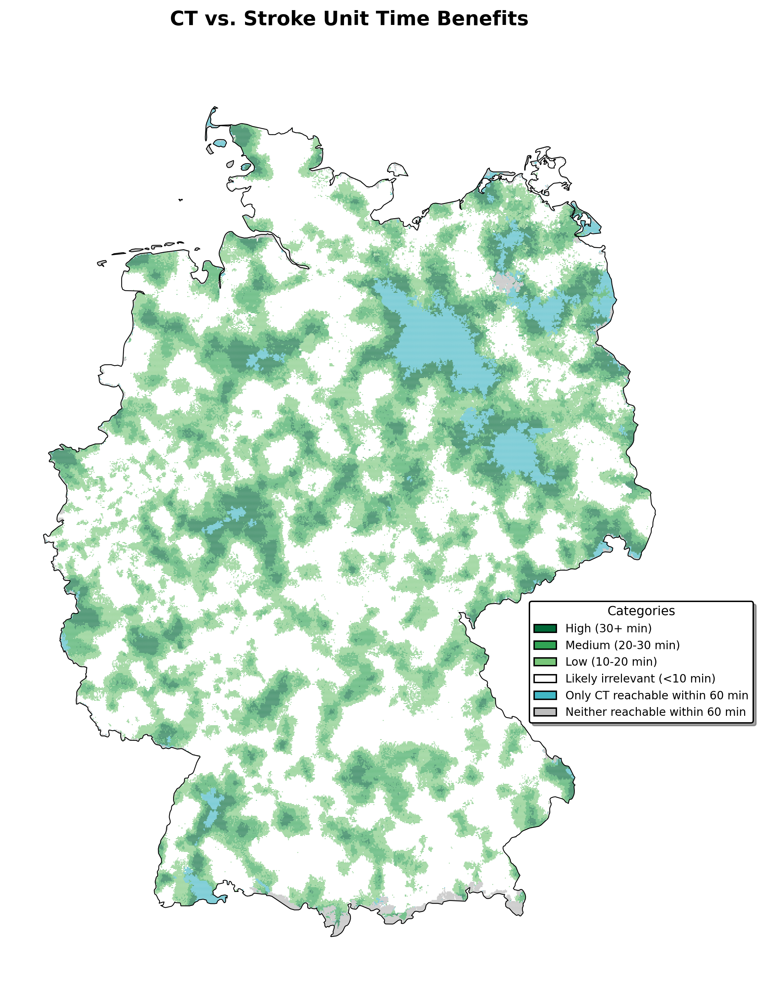

In [5]:
# Create benefit map for 10-minute threshold
if not benefit_gdf_10min.empty:
    print("Creating benefit visualization...")
    
    map_path = benefit.create_benefit_map(
        benefit_gdf_10min,
        title="CT vs. Stroke Unit Time Benefits",
        ct_penalty=0.0,
        benefit_threshold=10.0
    )
    
    print(f"✅ Map saved: {map_path.name}")
    
    # Display in notebook
    from IPython.display import Image, display
    display(Image(filename=str(map_path), width=800))
else:
    print("⚠️  No benefits to visualize")


## Step 3: Four-Scenario Comparison

Compare benefits across four key scenarios:
1. **Normal driving** - Standard conditions
2. **Emergency conditions** - +20% speed (emergency vehicles)  
3. **Traffic conditions** - 20% slower (bad traffic)
4. **Normal + 5min penalty** - Standard driving with CT processing time


In [6]:

# Check availability of scenario data
print("Scenario data availability check...")
print("-" * 34)

scenarios = {
    'Normal': {'suffix': '', 'penalty': 0, 'description': 'Standard driving conditions'},
    'Emergency': {'suffix': '_emergency', 'penalty': 0, 'description': 'Emergency vehicle (+20% speed)'},
    'Traffic': {'suffix': '_bad_traffic', 'penalty': 0, 'description': 'Bad traffic (-20% speed)'},
    'Normal +5min': {'suffix': '', 'penalty': 5, 'description': 'Standard + 5min CT penalty'}
}

scenario_data_available = {}
for name, config in scenarios.items():
    suffix = config['suffix']
    
    # Check if required files exist
    ct_available = all(
        (gs.config.DATA_DIR / f"poly{t}_all_CTs{suffix}.pkl").exists() 
        for t in [15, 30, 45, 60]
    )
 


    stroke_available = all(
        (gs.config.DATA_DIR / f"poly{t}{suffix}.pkl").exists() 
        for t in [15, 30, 45, 60]
    )
    
    available = ct_available and stroke_available
    scenario_data_available[name] = available
    
    status = "✓" if available else "✗"
    print(f"{status} {name}: {config['description']}")

available_scenarios = [name for name, avail in scenario_data_available.items() if avail]
print(f"\n📊 Available scenarios: {len(available_scenarios)}/4")


Scenario data availability check...
----------------------------------
✓ Normal: Standard driving conditions
✓ Emergency: Emergency vehicle (+20% speed)
✓ Traffic: Bad traffic (-20% speed)
✓ Normal +5min: Standard + 5min CT penalty

📊 Available scenarios: 4/4


In [7]:
# Diagnose Emergency Scenario Issue
print("🔍 Checking what's wrong with Emergency scenario...")

# Run diagnostic to check emergency scenario data
benefit.diagnose_emergency_scenario_issue()


🔍 Checking what's wrong with Emergency scenario...
🔍 Diagnosing Emergency Scenario Issue

📋 Normal Scenario (suffix: ''):
   Stroke Units:
     15min: ✅ 349/349 valid polygons
     30min: ✅ 349/349 valid polygons
     45min: ✅ 349/349 valid polygons
     60min: ✅ 349/349 valid polygons
   CT Hospitals:
     15min: ✅ 1475/1475 valid polygons
     30min: ✅ 1475/1475 valid polygons
     45min: ✅ 1475/1475 valid polygons
     60min: ✅ 1475/1475 valid polygons

📋 Emergency Scenario (suffix: '_emergency'):
   Stroke Units:
     15min: ✅ 349/349 valid polygons
     30min: ✅ 349/349 valid polygons
     45min: ✅ 349/349 valid polygons
     60min: ✅ 349/349 valid polygons
   CT Hospitals:
     15min: ✅ 1475/1475 valid polygons
     30min: ✅ 1475/1475 valid polygons
     45min: ✅ 1475/1475 valid polygons
     60min: ✅ 1475/1475 valid polygons

📋 Traffic Scenario (suffix: '_bad_traffic'):
   Stroke Units:
     15min: ✅ 349/349 valid polygons
     30min: ✅ 349/349 valid polygons
     45min: ✅ 349/3

True

Creating publication-ready four-scenario comparison...
🎨 Creating publication-ready four-scenario comparison
   Threshold: 10.0 min, CT penalty: 5.0 min

🔍 Checking scenario data quality...
🔍 Diagnosing Emergency Scenario Issue

📋 Normal Scenario (suffix: ''):
   Stroke Units:
     15min: ✅ 349/349 valid polygons
     30min: ✅ 349/349 valid polygons
     45min: ✅ 349/349 valid polygons
     60min: ✅ 349/349 valid polygons
   CT Hospitals:
     15min: ✅ 1475/1475 valid polygons
     30min: ✅ 1475/1475 valid polygons
     45min: ✅ 1475/1475 valid polygons
     60min: ✅ 1475/1475 valid polygons

📋 Emergency Scenario (suffix: '_emergency'):
   Stroke Units:
     15min: ✅ 349/349 valid polygons
     30min: ✅ 349/349 valid polygons
     45min: ✅ 349/349 valid polygons
     60min: ✅ 349/349 valid polygons
   CT Hospitals:
     15min: ✅ 1475/1475 valid polygons
     30min: ✅ 1475/1475 valid polygons
     45min: ✅ 1475/1475 valid polygons
     60min: ✅ 1475/1475 valid polygons

📋 Traffic Scenar

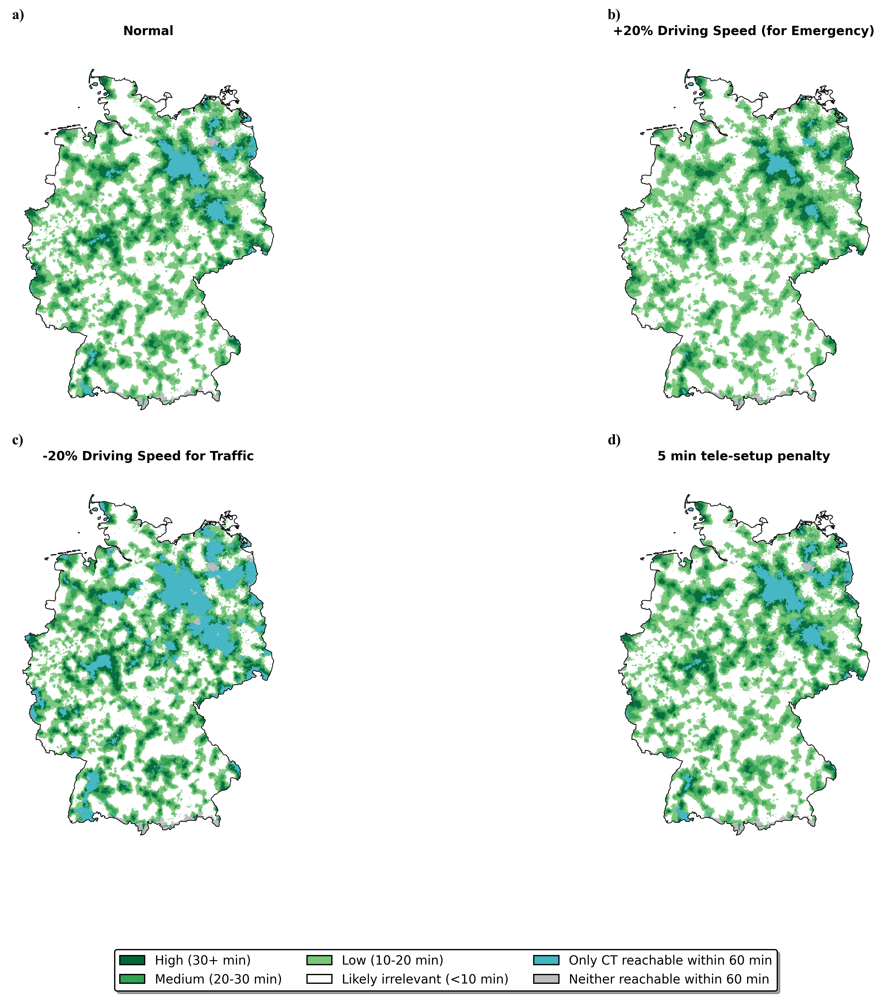

In [8]:
# Create publication-ready four-panel comparison using proper function
print("Creating publication-ready four-scenario comparison...")

# Use the proper function that builds on existing infrastructure
comparison_path = benefit.create_four_scenario_comparison_proper(
    benefit_threshold=10.0,
    ct_penalty=5.0,
    grid_resolution=0.01,  # Slightly coarser for faster processing
    time_bins=[5,10,15,20,25, 30,35, 40, 45, 50, 55, 60],
    use_parallel=True,
    max_workers=8
)

# Display the result
from IPython.display import Image, display
if comparison_path.exists():
    display(Image(filename=str(comparison_path), width=1000))
else:
    print("⚠️  Figure not created - check data availability")


🎨 Creating three-speed scenarios comparison
   Threshold: 10.0 min
   🔍 Calculating Normal...
🔍 Loading cached benefit analysis from benefit_analysis_e1f09274ca3df68bc9344be034cc005f.pkl
✅ Loaded 510,229 cached benefit points
     Found 510,229 benefit areas
   🔍 Calculating +20% Driving Speed...
🔍 Loading cached benefit analysis from benefit_analysis_a84e13d994a1f60d72ed930f81667c84.pkl
✅ Loaded 490,371 cached benefit points
     Found 490,371 benefit areas
   🔍 Calculating -20% Driving Speed...
🔍 Loading cached benefit analysis from benefit_analysis_6fd1cccc6bd828cbaab80f037c06aa64.pkl
✅ Loaded 530,209 cached benefit points
     Found 530,209 benefit areas
   🗺️  Filtering Normal data to Germany boundaries...
   🗺️  Filtering +20% Driving Speed data to Germany boundaries...
   🗺️  Filtering -20% Driving Speed data to Germany boundaries...
✅ Three-speed scenarios comparison saved:
   PNG: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding 

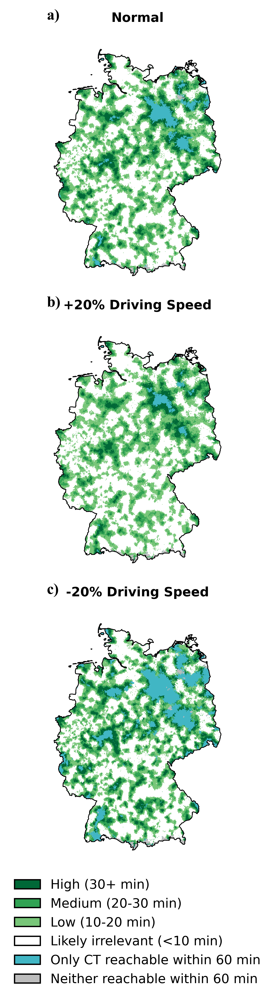

In [9]:
# Generate three-speed scenarios comparison (Normal, +20% Emergency, -20% Traffic)
from geostroke.benefit import three_speed_scenarios

# Create the three-speed scenarios figure
speed_comparison_path = three_speed_scenarios(
    benefit_threshold=10.0,  # Minimum time difference to consider significant
    grid_resolution=0.01,   # Grid resolution for analysis 
    use_parallel=True,       # Use parallel processing for faster computation
    max_workers=8,         # Use all available CPU cores
    force_recalc=False,
    grid_cell_deg=0.02,
    render_mode="polygons"
)

print(f"Three-speed scenarios comparison saved to: {speed_comparison_path}")

# Display the result
from IPython.display import Image, display
if speed_comparison_path.exists():
    display(Image(filename=str(speed_comparison_path), width=600))
else:
    print("⚠️  Figure not created - check data availability")

🎨 Creating three-penalty scenarios comparison
   Threshold: 10.0 min
   🔍 Calculating +10 min Penalty...
🔍 Loading cached benefit analysis from benefit_analysis_8bbcbc6b68cb611bd80af047072de13b.pkl
✅ Loaded 503,849 cached benefit points
     Found 503,849 benefit areas
   🔍 Calculating +20 min Penalty...
🔍 Loading cached benefit analysis from benefit_analysis_45bc02d3097aabca3210c08ce289b606.pkl
✅ Loaded 492,432 cached benefit points
     Found 492,432 benefit areas
   🔍 Calculating +30 min Penalty...
🔍 Loading cached benefit analysis from benefit_analysis_13fb98d817440368ff93f449c6ff2c44.pkl
✅ Loaded 538,657 cached benefit points
     Found 538,657 benefit areas
   🗺️  Filtering +10 min Penalty data to Germany boundaries...
   🗺️  Filtering +20 min Penalty data to Germany boundaries...
   🗺️  Filtering +30 min Penalty data to Germany boundaries...
✅ Three-penalty scenarios comparison saved:
   PNG: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics a

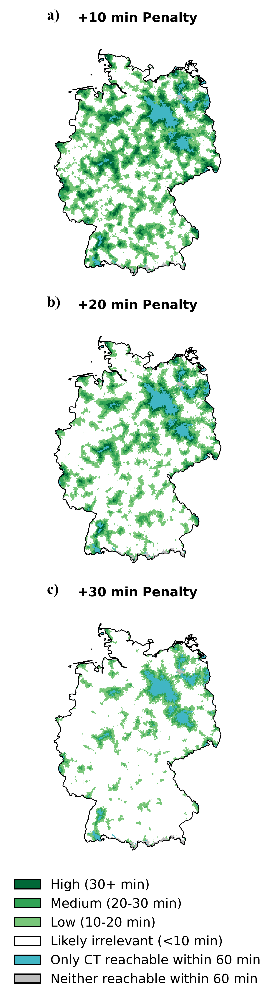

In [10]:
# Generate three-penalty scenarios comparison (+10, +20, +30 min penalties)
from geostroke.benefit import three_penalty_scenarios

# Create the three-penalty scenarios figure
penalty_comparison_path = three_penalty_scenarios(
    benefit_threshold=10.0,  # Minimum time difference to consider significant
    grid_resolution=0.01,   # Grid resolution for analysis
    use_parallel=True,       # Use parallel processing for faster computation
    max_workers=10,         # Use all available CPU cores
    force_recalc=False,
    render_mode="polygons"
)

print(f"Three-penalty scenarios comparison saved to: {penalty_comparison_path}")

from IPython.display import Image, display
if penalty_comparison_path.exists():
    display(Image(filename=str(penalty_comparison_path), width=600))
else:
    print("⚠️  Figure not created - check data availability")

## Step 4: Population Coverage


In [11]:
# Scenario-Specific Population & Area Coverage Analysis (FIXED v6 - buffer cells)
# -----------------------------------------------------------------------------
# Why v5 still failed:
#   grid -> category polygons (aggregate_points_to_grid) came back empty, so every
#   cat except the remainder had 0 km². Consequently raster sums were 0.
#   We'll skip that path and build polygons straight from the classified POINTS:
#   treat each grid point as the center of a grid cell (size = GRID_RESOLUTION),
#   create a square polygon, then dissolve per category. These are the exact
#   cells you plot in the maps, so population and area must agree.
# -----------------------------------------------------------------------------

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

from pathlib import Path
from typing import Dict, List

import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.features import rasterize
from shapely.geometry import Point, Polygon
from shapely.ops import unary_union

from geostroke import benefit

# ---------------------------- constants --------------------------------------
GRID_RESOLUTION = 0.01  # deg (~1 km)
HALF = GRID_RESOLUTION / 2.0
TIME_BINS = list(range(5, 65, 5))
CATEGORY_ORDER = [
    "High (30+ min)",
    "Medium (20-30 min)",
    "Low (10-20 min)",
    "Only CT reachable within 60 min",
    "Neither reachable within 60 min",
    "Likely irrelevant (<10 min)",
]

SCENARIOS = {
    "Normal Speed": {"suffix": "", "penalty": 0},
    "+20% Speed (Emergency)": {"suffix": "_emergency", "penalty": 0},
    "-20% Speed (Traffic)": {"suffix": "_bad_traffic", "penalty": 0},
    "+10min Penalty": {"suffix": "", "penalty": 10},
    "+20min Penalty": {"suffix": "", "penalty": 20},
    "+30min Penalty": {"suffix": "", "penalty": 30},
}

# ---------------------------- baseline data ---------------------------------
print("Scenario-specific population and area coverage analysis …")
print("=" * 60)

GERMANY = gs.data.load_germany_outline()
GERMANY_POLY = GERMANY.geometry.iloc[0]

with rasterio.open(gs.config.POP_RASTER) as src:
    pop_img, pop_transform = mask(src, GERMANY.geometry, crop=True)
    NODATA = src.nodata if src.nodata is not None else -200
    pop_arr_full = pop_img[0]
    pop_arr_full[pop_arr_full == NODATA] = 0
    POP_RASTER_CRS = src.crs
POP_GERMANY = int(pop_arr_full.sum())
print(f"🇩🇪 Total population: {POP_GERMANY:,}")

# regular grid of points (for area %)
minx, miny, maxx, maxy = GERMANY.total_bounds
xs = np.arange(minx, maxx + GRID_RESOLUTION, GRID_RESOLUTION)
ys = np.arange(miny, maxy + GRID_RESOLUTION, GRID_RESOLUTION)
pts = [Point(x, y) for x in xs for y in ys]
GERMANY_GRID = gpd.GeoSeries([p for p in pts if GERMANY_POLY.contains(p) or GERMANY_POLY.touches(p)], crs=GERMANY.crs)
GRID_COUNT = len(GERMANY_GRID)
print(f"🗺️  Grid points: {GRID_COUNT:,}")

# ---------------------------- helpers ---------------------------------------

def square_cell(point: Point, half: float = HALF) -> Polygon:
    x, y = point.x, point.y
    return Polygon([(x-half, y-half), (x+half, y-half), (x+half, y+half), (x-half, y+half)])


def build_category_cells(benefit_gdf: gpd.GeoDataFrame) -> Dict[str, Polygon]:
    """Create exclusive polygons per category by turning each classified grid point
    into a square cell and dissolving per category, sequentially subtracting to
    avoid overlaps. Returns dict cat -> (multi)polygon."""
    # Join Germany grid to benefit points to get category per cell
    grid_df = gpd.GeoDataFrame(geometry=GERMANY_GRID)
    joined = gpd.sjoin(grid_df, benefit_gdf[["benefit_category", "geometry"]], how="left", predicate="within")
    joined["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)

    # turn each point to cell poly
    joined["cell_poly"] = joined.geometry.apply(square_cell)

    # dissolve sequentially to guarantee exclusivity
    cat_geoms: Dict[str, Polygon] = {}
    remaining = GERMANY_POLY
    
    for cat in CATEGORY_ORDER[:-1]:
        sub = joined.loc[joined["benefit_category"] == cat, "cell_poly"]
        if sub.empty:
            cat_geoms[cat] = None
            continue
        u = unary_union(sub.values)
        if not u.is_empty:
            u = u.intersection(remaining)
        cat_geoms[cat] = u
        remaining = remaining.difference(u)
    cat_geoms["Likely irrelevant (<10 min)"] = remaining
    return cat_geoms


def rasterize_and_sum(cat_geoms: Dict[str, Polygon]) -> Dict[str, int]:
    cat_codes = {cat: i+1 for i, cat in enumerate(CATEGORY_ORDER)}
    shapes = []
    for cat, geom in cat_geoms.items():
        if geom is None or geom.is_empty:
            continue
        # flatten multiparts
        geoms_iter = list(geom.geoms) if hasattr(geom, "geoms") else [geom]
        for g in geoms_iter:
            gdf = gpd.GeoDataFrame(geometry=[g], crs=GERMANY.crs)
            if gdf.crs != POP_RASTER_CRS:
                gdf = gdf.to_crs(POP_RASTER_CRS)
            shapes.append((gdf.geometry.iloc[0], cat_codes[cat]))

    cat_raster = rasterize(
        shapes=shapes,
        out_shape=pop_arr_full.shape,
        transform=pop_transform,
        fill=0,
        dtype="uint8"
    )
    return {cat: int(pop_arr_full[cat_raster == code].sum()) for cat, code in cat_codes.items()}

# ---------------------------- main loop -------------------------------------
records: List[dict] = []

for scenario_name, cfg in SCENARIOS.items():
    print(f"\n🔍 {scenario_name}")

    benefit_gdf = benefit.calculate_time_benefits_parallel(
        ct_suffix=f"_all_CTs{cfg['suffix']}",
        stroke_suffix=cfg['suffix'],
        ct_penalty=cfg['penalty'],
        benefit_threshold=10.0,
        grid_resolution=GRID_RESOLUTION,
        time_bins=TIME_BINS,
        max_workers=10,
        force_recalc=False,
    )

    if benefit_gdf.empty:
        print("   No benefit points -> everything Likely irrelevant")
        records.append({
            "scenario": scenario_name,
            "category": "Likely irrelevant (<10 min)",
            "area_pct": 100.0,
            "population": POP_GERMANY,
            "population_pct": 100.0,
        })
        continue

    if benefit_gdf.crs != GERMANY.crs:
        benefit_gdf = benefit_gdf.to_crs(GERMANY.crs)
    benefit_gdf = gpd.sjoin(benefit_gdf, GERMANY[["geometry"]], how="inner", predicate="within")
    if 'index_right' in benefit_gdf.columns:
        benefit_gdf = benefit_gdf.drop(columns=['index_right'])

    # AREA from point counts (fast, unchanged)
    grid_df = gpd.GeoDataFrame(geometry=GERMANY_GRID)
    grid_join = gpd.sjoin(grid_df, benefit_gdf[["benefit_category", "geometry"]], how="left", predicate="within")
    grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
    area_counts = grid_join["benefit_category"].value_counts()

    # POP from buffered cells
    cat_geoms = build_category_cells(benefit_gdf)

    # Debug areas in km²
    for cat in CATEGORY_ORDER:
        geom = cat_geoms.get(cat)
        if geom is None or geom.is_empty:
            area_km2 = 0.0
        else:
            area_km2 = gpd.GeoSeries([geom], crs=GERMANY.crs).to_crs(3035).area.iloc[0] / 1e6
        print(f"   [area km²] {cat}: {area_km2:,.1f}")

    pop_counts = rasterize_and_sum(cat_geoms)
    for cat in CATEGORY_ORDER:
        print(f"   [pop] {cat}: {pop_counts.get(cat, 0):,}")

    diff = POP_GERMANY - sum(pop_counts.values())
    if diff != 0:
        print(f"   ⚠ pop mismatch: {diff}")
        pop_counts["Likely irrelevant (<10 min)"] += diff

    for cat in CATEGORY_ORDER:
        area_pts = int(area_counts.get(cat, 0))
        area_pct = round(area_pts / GRID_COUNT * 100, 1)
        pop_abs = pop_counts.get(cat, 0)
        pop_pct = round(pop_abs / POP_GERMANY * 100, 1)
        records.append({
            "scenario": scenario_name,
            "category": cat,
            "area_pct": area_pct,
            "population": pop_abs,
            "population_pct": pop_pct,
        })

# ---------------------------- results ---------------------------------------
results_df = pd.DataFrame(records)

area_table = (results_df.pivot_table(index="scenario", columns="category", values="area_pct", fill_value=0)
              .loc[:, CATEGORY_ORDER].round(1))

pop_abs_table = (results_df.pivot_table(index="scenario", columns="category", values="population", fill_value=0)
                 .loc[:, CATEGORY_ORDER])

pop_pct_table = (results_df.pivot_table(index="scenario", columns="category", values="population_pct", fill_value=0)
                 .loc[:, CATEGORY_ORDER].round(1))

pd.set_option("display.width", None)
print("\n📊 Area %:\n", area_table)
print("\n👥 Pop abs:\n", pop_abs_table.map(lambda x: f"{x:,}"))
print("\n👥 Pop %:\n", pop_pct_table)

print("\n✅ Verification:")
for s in area_table.index:
    print(f"  {s}: area {area_table.loc[s].sum():.1f}% - pop {pop_pct_table.loc[s].sum():.1f}%")
print("Done.")


Scenario-specific population and area coverage analysis …
🇩🇪 Total population: 83,194,666
🗺️  Grid points: 459,349

🔍 Normal Speed
🔍 Loading cached benefit analysis from benefit_analysis_e1f09274ca3df68bc9344be034cc005f.pkl
✅ Loaded 510,229 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:173: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:90: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object o

   [area km²] High (30+ min): 28,754.6
   [area km²] Medium (20-30 min): 56,270.0
   [area km²] Low (10-20 min): 90,946.7
   [area km²] Only CT reachable within 60 min: 15,222.4
   [area km²] Neither reachable within 60 min: 4,804.7
   [area km²] Likely irrelevant (<10 min): 161,675.2
   [pop] High (30+ min): 4,018,524
   [pop] Medium (20-30 min): 7,813,066
   [pop] Low (10-20 min): 18,441,260
   [pop] Only CT reachable within 60 min: 574,085
   [pop] Neither reachable within 60 min: 213,887
   [pop] Likely irrelevant (<10 min): 52,133,842
   ⚠ pop mismatch: 2

🔍 +20% Speed (Emergency)
🔍 Loading cached benefit analysis from benefit_analysis_a84e13d994a1f60d72ed930f81667c84.pkl
✅ Loaded 490,371 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:173: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:90: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object o

   [area km²] High (30+ min): 20,166.5
   [area km²] Medium (20-30 min): 49,856.0
   [area km²] Low (10-20 min): 101,157.5
   [area km²] Only CT reachable within 60 min: 5,183.9
   [area km²] Neither reachable within 60 min: 4,380.4
   [area km²] Likely irrelevant (<10 min): 176,929.1
   [pop] High (30+ min): 2,252,573
   [pop] Medium (20-30 min): 6,413,206
   [pop] Low (10-20 min): 17,913,479
   [pop] Only CT reachable within 60 min: 186,189
   [pop] Neither reachable within 60 min: 206,279
   [pop] Likely irrelevant (<10 min): 56,222,938
   ⚠ pop mismatch: 2

🔍 -20% Speed (Traffic)
🔍 Loading cached benefit analysis from benefit_analysis_6fd1cccc6bd828cbaab80f037c06aa64.pkl
✅ Loaded 530,209 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:173: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:90: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object o

   [area km²] High (30+ min): 35,277.1
   [area km²] Medium (20-30 min): 55,986.7
   [area km²] Low (10-20 min): 75,098.3
   [area km²] Only CT reachable within 60 min: 39,190.5
   [area km²] Neither reachable within 60 min: 5,693.1
   [area km²] Likely irrelevant (<10 min): 146,427.9
   [pop] High (30+ min): 6,176,094
   [pop] Medium (20-30 min): 9,007,366
   [pop] Low (10-20 min): 18,140,731
   [pop] Only CT reachable within 60 min: 1,880,509
   [pop] Neither reachable within 60 min: 229,184
   [pop] Likely irrelevant (<10 min): 47,760,780
   ⚠ pop mismatch: 2

🔍 +10min Penalty
🔍 Loading cached benefit analysis from benefit_analysis_8bbcbc6b68cb611bd80af047072de13b.pkl
✅ Loaded 503,849 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:173: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:90: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object o

   [area km²] High (30+ min): 24,604.5
   [area km²] Medium (20-30 min): 52,869.1
   [area km²] Low (10-20 min): 91,149.5
   [area km²] Only CT reachable within 60 min: 15,222.4
   [area km²] Neither reachable within 60 min: 4,804.7
   [area km²] Likely irrelevant (<10 min): 169,023.3
   [pop] High (30+ min): 2,437,551
   [pop] Medium (20-30 min): 5,855,786
   [pop] Low (10-20 min): 14,158,787
   [pop] Only CT reachable within 60 min: 574,085
   [pop] Neither reachable within 60 min: 213,885
   [pop] Likely irrelevant (<10 min): 59,954,570
   ⚠ pop mismatch: 2

🔍 +20min Penalty
🔍 Loading cached benefit analysis from benefit_analysis_45bc02d3097aabca3210c08ce289b606.pkl
✅ Loaded 492,432 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:173: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:90: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object o

   [area km²] High (30+ min): 11,885.9
   [area km²] Medium (20-30 min): 34,425.8
   [area km²] Low (10-20 min): 74,653.5
   [area km²] Only CT reachable within 60 min: 15,222.4
   [area km²] Neither reachable within 60 min: 4,804.7
   [area km²] Likely irrelevant (<10 min): 216,681.3
   [pop] High (30+ min): 831,379
   [pop] Medium (20-30 min): 2,625,470
   [pop] Low (10-20 min): 7,641,977
   [pop] Only CT reachable within 60 min: 574,099
   [pop] Neither reachable within 60 min: 213,880
   [pop] Likely irrelevant (<10 min): 71,307,859
   ⚠ pop mismatch: 2

🔍 +30min Penalty
🔍 Loading cached benefit analysis from benefit_analysis_13fb98d817440368ff93f449c6ff2c44.pkl
✅ Loaded 538,657 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:173: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/1212713330.py:90: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object o

   [area km²] High (30+ min): 0.0
   [area km²] Medium (20-30 min): 17,036.3
   [area km²] Low (10-20 min): 41,231.9
   [area km²] Only CT reachable within 60 min: 15,222.4
   [area km²] Neither reachable within 60 min: 4,804.7
   [area km²] Likely irrelevant (<10 min): 279,378.3
   [pop] High (30+ min): 0
   [pop] Medium (20-30 min): 955,902
   [pop] Low (10-20 min): 2,850,726
   [pop] Only CT reachable within 60 min: 574,075
   [pop] Neither reachable within 60 min: 213,884
   [pop] Likely irrelevant (<10 min): 78,600,078
   ⚠ pop mismatch: 1

📊 Area %:
 category                High (30+ min)  Medium (20-30 min)  Low (10-20 min)  \
scenario                                                                      
+10min Penalty                     7.0                14.8             25.5   
+20% Speed (Emergency)             5.8                14.0             28.3   
+20min Penalty                     3.4                 9.7             20.9   
+30min Penalty                     0.0    

In [12]:
pop_abs_table

category,High (30+ min),Medium (20-30 min),Low (10-20 min),Only CT reachable within 60 min,Neither reachable within 60 min,Likely irrelevant (<10 min)
scenario,,,,,,
+10min Penalty,2437551.0,5855786.0,14158787.0,574085.0,213885.0,59954572.0
+20% Speed (Emergency),2252573.0,6413206.0,17913479.0,186189.0,206279.0,56222940.0
+20min Penalty,831379.0,2625470.0,7641977.0,574099.0,213880.0,71307861.0
+30min Penalty,0.0,955902.0,2850726.0,574075.0,213884.0,78600079.0
-20% Speed (Traffic),6176094.0,9007366.0,18140731.0,1880509.0,229184.0,47760782.0
Normal Speed,4018524.0,7813066.0,18441260.0,574085.0,213887.0,52133844.0


In [13]:
pop_pct_table

category,High (30+ min),Medium (20-30 min),Low (10-20 min),Only CT reachable within 60 min,Neither reachable within 60 min,Likely irrelevant (<10 min)
scenario,,,,,,
+10min Penalty,2.9,7.0,17.0,0.7,0.3,72.1
+20% Speed (Emergency),2.7,7.7,21.5,0.2,0.2,67.6
+20min Penalty,1.0,3.2,9.2,0.7,0.3,85.7
+30min Penalty,0.0,1.1,3.4,0.7,0.3,94.5
-20% Speed (Traffic),7.4,10.8,21.8,2.3,0.3,57.4
Normal Speed,4.8,9.4,22.2,0.7,0.3,62.7


In [14]:
area_table

category,High (30+ min),Medium (20-30 min),Low (10-20 min),Only CT reachable within 60 min,Neither reachable within 60 min,Likely irrelevant (<10 min)
scenario,,,,,,
+10min Penalty,7.0,14.8,25.5,4.4,1.4,46.9
+20% Speed (Emergency),5.8,14.0,28.3,1.5,1.3,49.1
+20min Penalty,3.4,9.7,20.9,4.4,1.4,60.1
+30min Penalty,0.0,4.9,11.7,4.4,1.4,77.7
-20% Speed (Traffic),9.9,15.6,21.0,11.2,1.7,40.6
Normal Speed,8.1,15.8,25.4,4.4,1.4,44.9


# State and County Analysis

In [15]:
# ================== STATES & COUNTIES — NORMAL SCENARIO (render_mode support) ==================
# Adds render_mode = "points" | "polygons" | "raster"  + robust fixes for dissolve/KeyError
# -----------------------------------------------------------------------------------------------
import os, json, warnings, math
from pathlib import Path
from typing import Dict, List, Optional, Tuple
warnings.filterwarnings("ignore", category=UserWarning)

import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from rasterio.features import rasterize, geometry_mask
from shapely.geometry import Point, Polygon, shape
from shapely.ops import unary_union

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.backends.backend_pdf import PdfPages

# ---------- datashader fallbacks ----------
try:
    from geostroke.benefit import datashade_categories, imshow_datashaded
except Exception:
    import datashader as ds
    import datashader.transfer_functions as tf
    from matplotlib.colors import ListedColormap

    def datashade_categories(gdf, germany, category_col, cmap_dict, width=800, height=1000,
                             x_range=None, y_range=None):
        if gdf.empty:
            xmin, ymin, xmax, ymax = germany.total_bounds
            img = np.zeros((height, width, 4), dtype=np.uint8)
            return img, (xmin, xmax, ymin, ymax), []
        if gdf.crs != germany.crs and germany.crs is not None:
            gdf = gdf.to_crs(germany.crs)

        xmin, ymin, xmax, ymax = germany.total_bounds
        if x_range is None: x_range = (xmin, xmax)
        if y_range is None: y_range = (ymin, ymax)

        cats = list(cmap_dict.keys())
        cat_to_int = {c: i for i, c in enumerate(cats)}
        gdf = gdf.copy()
        gdf["_cat_int"] = gdf[category_col].map(cat_to_int).fillna(-1).astype(int)
        gdf["x"] = gdf.geometry.x
        gdf["y"] = gdf.geometry.y

        cvs = ds.Canvas(plot_width=width, plot_height=height, x_range=x_range, y_range=y_range)
        agg = cvs.points(gdf, x="x", y="y", agg=ds.max("_cat_int"))

        palette = ["#00000000"] + [cmap_dict[c] for c in cats]
        cmap = ListedColormap(palette)

        arr = agg.to_pandas().values
        arr = arr.filled(-1).astype(int)
        rgba = cmap(arr + 1, bytes=True)
        rgba = np.flipud(rgba)
        extent = (x_range[0], x_range[1], y_range[0], y_range[1])
        return rgba, extent, cats

    def imshow_datashaded(ax, img, extent):
        ax.imshow(img, extent=extent, origin='lower', interpolation='nearest')
    


# ---------- CONFIG ----------
SCENARIO_NAME = "Normal Speed"
SCENARIO_CFG  = {"suffix": "", "penalty": 0}

RENDER_MODE        = "polygons"   # "points" | "polygons" | "raster"
GRID_SHAPE         = "square"     # for polygon render: "square" | "hex"
CELL_SIZE_DEG      = 0.01         # ~2km @ DE for polygon mode
DISSOLVE_POLYS     = True         # dissolve by category for smoother fill
RASTER_W, RASTER_H = 900, 1200    # raster size if render_mode="raster"
PDF_STATES         = True
PDF_COUNTIES       = True

RESULT_ROOT     = gs.config.RESULTS_DIR
STATE_DIR       = RESULT_ROOT / "States"
COUNTY_DIR      = RESULT_ROOT / "Counties"
COUNTY_DETAILED = RESULT_ROOT / "Counties_detailed"
STATE_DIR.mkdir(parents=True, exist_ok=True)
COUNTY_DIR.mkdir(parents=True, exist_ok=True)
COUNTY_DETAILED.mkdir(parents=True, exist_ok=True)

BENEFIT_COLORS = {
    "High (30+ min)"                  : "#006837",
    "Medium (20-30 min)"              : "#31a354",
    "Low (10-20 min)"                 : "#78c679",
    "Only CT reachable within 60 min" : "#41b6c4",
    "Neither reachable within 60 min" : "#bdbdbd",
    "Likely irrelevant (<10 min)"     : "white"
}

# ---------- prerequisites ----------
assert 'GRID_RESOLUTION' in globals(), "Run national v6 cell first."
assert {'GERMANY','GERMANY_GRID','CATEGORY_ORDER',
        'pop_arr_full','pop_transform','POP_RASTER_CRS'}.issubset(globals()), "Prereqs missing."

HALF = GRID_RESOLUTION / 2.0
GERMANY_POLY = GERMANY.geometry.iloc[0]

# ---------- load states/counties ----------
def _clean_str(val, default):
    return str(val) if (val is not None and val == val and str(val).strip()) else default

if 'states' not in globals():
    states = gpd.read_file("shp/germany-states.geojson").set_crs(4326)
if 'counties' not in globals():
    import fiona
    recs = []
    with fiona.open("shp/georef-germany-kreis@public.geojson") as src:
        crs = src.crs
        for feat in src:
            prop = feat["properties"]
            for key in ("lan_name", "lan_code", "krs_name", "krs_name_short"):
                if key in prop and isinstance(prop[key], list):
                    prop[key] = prop[key][0]
            recs.append({**prop, "geometry": shape(feat["geometry"])})
    counties = gpd.GeoDataFrame(recs, crs=crs).set_crs(4326)
    counties["state_name"]  = counties.apply(lambda r: _clean_str(r.get("lan_name"), "Unknown_State"), axis=1)
    counties["county_name"] = counties.apply(lambda r: _clean_str(r.get("krs_name") or r.get("krs_name_short"), "Unknown_County"), axis=1)

states   = states.to_crs(GERMANY.crs)
counties = counties.to_crs(GERMANY.crs)

# ---------- helper: fishnet/hex ----------
def build_fishnet(bounds: Tuple[float,float,float,float], cell_size_deg: float, crs) -> gpd.GeoDataFrame:
    minx, miny, maxx, maxy = bounds
    xs = np.arange(minx, maxx, cell_size_deg)
    ys = np.arange(miny, maxy, cell_size_deg)
    polys = [Polygon([(x,y),(x+cell_size_deg,y),(x+cell_size_deg,y+cell_size_deg),(x,y+cell_size_deg)])
             for x in xs for y in ys]
    return gpd.GeoDataFrame({"geometry": polys}, crs=crs)

def build_hex_grid(bounds: Tuple[float,float,float,float], cell_size_deg: float, crs) -> gpd.GeoDataFrame:
    w = cell_size_deg
    h = math.sqrt(3) * w / 2
    minx, miny, maxx, maxy = bounds
    cols = int(np.ceil((maxx-minx)/w))+1
    rows = int(np.ceil((maxy-miny)/h))+1
    polys = []
    for r in range(rows):
        y = miny + r*h
        x_off = (w/2) if (r % 2) else 0
        for c in range(cols):
            x = minx + c*w + x_off
            poly = Polygon([
                (x-w/2, y),
                (x-w/4, y+h/2),
                (x+w/4, y+h/2),
                (x+w/2, y),
                (x+w/4, y-h/2),
                (x-w/4, y-h/2)
            ])
            polys.append(poly)
    return gpd.GeoDataFrame({"geometry": polys}, crs=crs)

def make_benefit_handles(color_dict):
    handles = []
    for cat, col in color_dict.items():
        ec = "black" if col.lower() == "white" else "black"  # white patch needs an edge
        handles.append(mpatches.Patch(facecolor=col, edgecolor=ec, linewidth=0.6, label=cat))
    return handles

# ---------- classification & polygons ----------
def square_cell(pt: Point, half: float = HALF) -> Polygon:
    x, y = pt.x, pt.y
    return Polygon([(x-half, y-half), (x+half, y-half), (x+half, y+half), (x-half, y+half)])

def classify_grid_points(benefit_gdf: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    grid_df = gpd.GeoDataFrame(geometry=GERMANY_GRID, crs=GERMANY.crs)
    joined = gpd.sjoin(grid_df, benefit_gdf[["benefit_category","geometry"]],
                       how="left", predicate="within")
    joined["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
    return joined.drop(columns=["index_right"], errors="ignore")

def build_cat_geoms_from_grid(grid_with_cat: gpd.GeoDataFrame) -> Dict[str, Polygon]:
    grid_with_cat["cell_poly"] = grid_with_cat.geometry.apply(square_cell)
    cat_geoms: Dict[str, Polygon] = {}
    remaining = GERMANY_POLY
    for cat in CATEGORY_ORDER[:-1]:
        sub = grid_with_cat.loc[grid_with_cat["benefit_category"] == cat, "cell_poly"]
        if sub.empty:
            cat_geoms[cat] = None
            continue
        u = unary_union(sub.values)
        if not u.is_empty:
            u = u.intersection(remaining)
        cat_geoms[cat] = u
        remaining = remaining.difference(u)
    cat_geoms["Likely irrelevant (<10 min)"] = remaining
    return cat_geoms

def pop_for_geom(geom):
    gdf = gpd.GeoDataFrame(geometry=[geom], crs=GERMANY.crs)
    if gdf.crs != POP_RASTER_CRS:
        gdf = gdf.to_crs(POP_RASTER_CRS)
    mask_bool = geometry_mask(gdf.geometry, transform=pop_transform,
                              invert=True, out_shape=pop_arr_full.shape)
    return int(pop_arr_full[mask_bool].sum())

def pop_by_categories(cat_geoms: Dict[str, Polygon], region_geom=None) -> Dict[str, int]:
    reg_mask = None
    if region_geom is not None:
        gdf = gpd.GeoDataFrame(geometry=[region_geom], crs=GERMANY.crs)
        if gdf.crs != POP_RASTER_CRS:
            gdf = gdf.to_crs(POP_RASTER_CRS)
        reg_mask = geometry_mask(gdf.geometry, transform=pop_transform,
                                 invert=True, out_shape=pop_arr_full.shape)
    out = {}
    for i, cat in enumerate(CATEGORY_ORDER, start=1):
        geom = cat_geoms.get(cat)
        if geom is None or geom.is_empty:
            out[cat] = 0
            continue
        geoms_iter = list(geom.geoms) if hasattr(geom, "geoms") else [geom]
        shapes = []
        for g in geoms_iter:
            gg = gpd.GeoDataFrame(geometry=[g], crs=GERMANY.crs)
            if gg.crs != POP_RASTER_CRS:
                gg = gg.to_crs(POP_RASTER_CRS)
            shapes.append((gg.geometry.iloc[0], i))
        rast = rasterize(shapes, out_shape=pop_arr_full.shape, transform=pop_transform,
                         fill=0, dtype="uint16")
        mask_cat = (rast == i)
        if reg_mask is not None:
            mask_cat &= reg_mask
        out[cat] = int(pop_arr_full[mask_cat].sum())
    return out

def stats_for_region(region_geom, region_name, grid_with_cat, cat_geoms) -> pd.DataFrame:
    reg_gdf = gpd.GeoDataFrame(geometry=[region_geom], crs=grid_with_cat.crs)
    pts_in = gpd.sjoin(grid_with_cat[["geometry","benefit_category"]],
                       reg_gdf, how="inner", predicate="within").drop(columns="index_right", errors="ignore")
    total_pts = len(pts_in)
    area_counts = pts_in["benefit_category"].value_counts()

    reg_pop = pop_for_geom(region_geom)
    pop_counts = pop_by_categories(cat_geoms, region_geom)
    diff = reg_pop - sum(pop_counts.values())
    if diff != 0:
        pop_counts["Likely irrelevant (<10 min)"] += diff

    rows=[]
    for cat in CATEGORY_ORDER:
        a = int(area_counts.get(cat, 0))
        rows.append({
            "region": region_name,
            "category": cat,
            "area_pts": a,
            "area_pct": round(a/total_pts*100, 1) if total_pts else 0,
            "population": pop_counts.get(cat, 0),
            "population_pct": round(pop_counts.get(cat, 0)/reg_pop*100, 1) if reg_pop else 0
        })
    return pd.DataFrame(rows)

# ---------- rendering helpers ----------
def _scale_markersize(figsize_current, figsize_ref=(12,10), markersize_ref=0.5):
    s = (figsize_current[0]*figsize_current[1])/(figsize_ref[0]*figsize_ref[1])
    return markersize_ref / s

def _ensure_benefit_column(df: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    if "benefit_category" not in df.columns and df.index.name == "benefit_category":
        df = df.reset_index()
    return df

def region_plot(ax, region_geom, benefit_gdf, grid_with_cat, render_mode,
                benefit_colors, germany, markersize=0.5,
                raster_w=900, raster_h=1200,
                grid_shape="square", cell_size_deg=0.02, dissolve=False):

    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values(): sp.set_visible(False)

    gpd.GeoDataFrame(geometry=[region_geom], crs=germany.crs).boundary.plot(
        ax=ax, color="black", linewidth=0.6, zorder=3)

    if render_mode == "raster":
        sub = gpd.sjoin(benefit_gdf[["geometry","benefit_category"]],
                        gpd.GeoDataFrame(geometry=[region_geom], crs=germany.crs),
                        how="inner", predicate="within").drop(columns="index_right", errors="ignore")
        if sub.empty: return
        img, extent, _ = datashade_categories(
            sub,
            gpd.GeoDataFrame(geometry=[region_geom], crs=germany.crs),
            category_col="benefit_category",
            cmap_dict=benefit_colors,
            width=raster_w, height=raster_h
        )
        imshow_datashaded(ax, img, extent)

    elif render_mode == "polygons":
        pts_in = gpd.sjoin(grid_with_cat[["geometry","benefit_category"]],
                           gpd.GeoDataFrame(geometry=[region_geom], crs=grid_with_cat.crs),
                           how="inner", predicate="within").drop(columns="index_right", errors="ignore")
        if pts_in.empty: return

        if grid_shape in ("square","hex"):
            bounds = region_geom.bounds
            grid = (build_hex_grid(bounds, cell_size_deg, germany.crs)
                    if grid_shape=="hex" else
                    build_fishnet(bounds, cell_size_deg, germany.crs))
            grid = gpd.overlay(grid, gpd.GeoDataFrame(geometry=[region_geom], crs=germany.crs), how="intersection")

            joined = gpd.sjoin(pts_in, grid, how="inner", predicate="within")
            cats = joined.groupby("index_right")["benefit_category"].agg(lambda v: v.value_counts().idxmax())
            grid["benefit_category"] = cats
            grid = grid.dropna(subset=["benefit_category"])
            if dissolve:
                grid = grid.dissolve(by="benefit_category")
                grid = _ensure_benefit_column(grid)

            for cat, col in benefit_colors.items():
                sub_poly = grid[grid["benefit_category"]==cat]
                if sub_poly.empty: continue
                sub_poly.plot(ax=ax, facecolor=col, edgecolor='none', linewidth=0, zorder=2, rasterized=True)

        else:
            pts_in["cell_poly"] = pts_in.geometry.apply(square_cell)
            polys = (pts_in[["benefit_category","cell_poly"]]
                     .rename(columns={"cell_poly":"geometry"})
                     .set_geometry("geometry"))
            if dissolve:
                polys = polys.dissolve(by="benefit_category")
                polys = _ensure_benefit_column(polys)
            for cat, col in benefit_colors.items():
                sub_poly = polys[polys["benefit_category"]==cat]
                if sub_poly.empty: continue
                sub_poly.plot(ax=ax, facecolor=col, edgecolor='none', linewidth=0, zorder=2, rasterized=True)

    else:  # points
        pts_in = gpd.sjoin(grid_with_cat[["geometry","benefit_category"]],
                           gpd.GeoDataFrame(geometry=[region_geom], crs=grid_with_cat.crs),
                           how="inner", predicate="within").drop(columns="index_right", errors="ignore")
        for cat, col in benefit_colors.items():
            sub_pts = pts_in[pts_in["benefit_category"]==cat]
            if sub_pts.empty: continue
            sub_pts.plot(ax=ax, color=col, markersize=markersize, linewidth=0,
                         alpha=0.8, zorder=2, rasterized=True)

# ---------- get / calc benefit_gdf & grid_with_cat ----------
if 'benefit_gdf' not in globals():
    print("Calculating Normal Speed benefits …")
    benefit_gdf = benefit.calculate_time_benefits_parallel(
        ct_suffix=f"_all_CTs{SCENARIO_CFG['suffix']}",
        stroke_suffix=SCENARIO_CFG['suffix'],
        ct_penalty=SCENARIO_CFG['penalty'],
        benefit_threshold=10.0,
        grid_resolution=GRID_RESOLUTION,
        time_bins=TIME_BINS,
        max_workers=10,
        force_recalc=False,
    )
    if benefit_gdf.crs != GERMANY.crs:
        benefit_gdf = benefit_gdf.to_crs(GERMANY.crs)
    benefit_gdf = gpd.sjoin(benefit_gdf, GERMANY[["geometry"]], how="inner", predicate="within")
    benefit_gdf.drop(columns=["index_right"], inplace=True, errors="ignore")

if 'grid_with_cat' not in globals():
    grid_with_cat = classify_grid_points(benefit_gdf)

if 'cat_geoms' not in globals():
    cat_geoms = build_cat_geoms_from_grid(grid_with_cat)

# ---------- STATES ----------
print("States …")
state_rows = []
pdf_state_path = STATE_DIR / f"Benefit_{SCENARIO_NAME.replace(' ','_')}.pdf"
pdf_state = PdfPages(pdf_state_path) if PDF_STATES else None

for _, st in states.iterrows():
    st_name = st.get('NAME_1', 'Unknown')
    df_stats = stats_for_region(st.geometry, st_name, grid_with_cat, cat_geoms)
    state_rows.append(df_stats)

    png_path = STATE_DIR / f"Benefit_{st_name.replace(' ','_')}_{SCENARIO_NAME.replace(' ','_')}.png"
    fig, ax = plt.subplots(figsize=(6,6), dpi=300)
    ms = _scale_markersize((6,6), (12,10), 0.5)
    region_plot(ax, st.geometry, benefit_gdf, grid_with_cat, RENDER_MODE,
                BENEFIT_COLORS, GERMANY, markersize=ms,
                raster_w=RASTER_W, raster_h=RASTER_H,
                grid_shape=GRID_SHAPE, cell_size_deg=CELL_SIZE_DEG,
                dissolve=DISSOLVE_POLYS)
    ax.set_title(f"{st_name} – {SCENARIO_NAME}", fontsize=11, fontweight="bold")
    handles = make_benefit_handles(BENEFIT_COLORS)
    fig.subplots_adjust(bottom=0.18)  # leave space for legend
    fig.legend(handles=handles,
            loc="lower center",
            ncol=3,
            frameon=False,
            fontsize=7)
    fig.savefig(png_path, dpi=300, bbox_inches="tight"); plt.close(fig)

    if pdf_state:
        fig = plt.figure(figsize=(8.27, 5.83))
        img = plt.imread(png_path); plt.imshow(img); plt.axis('off')
        plt.tight_layout(); pdf_state.savefig(fig, bbox_inches="tight"); plt.close(fig)

if pdf_state:
    pdf_state.close()
    print(f"   -> State PDF saved: {pdf_state_path.name}")

state_df = pd.concat(state_rows, ignore_index=True)
state_xlsx = STATE_DIR / f"benefit_state_stats_{SCENARIO_NAME.replace(' ','_')}.xlsx"
with pd.ExcelWriter(state_xlsx, engine='openpyxl') as w:
    state_df.to_excel(w, sheet_name="long", index=False)
    (state_df.pivot_table(index="region", columns="category", values="area_pct", fill_value=0)
     .reindex(columns=CATEGORY_ORDER)).to_excel(w, sheet_name="area_pct")
    (state_df.pivot_table(index="region", columns="category", values="population_pct", fill_value=0)
     .reindex(columns=CATEGORY_ORDER)).to_excel(w, sheet_name="pop_pct")
    (state_df.pivot_table(index="region", columns="category", values="population", fill_value=0)
     .reindex(columns=CATEGORY_ORDER)).to_excel(w, sheet_name="pop_abs")
print(f"   -> State Excel saved: {state_xlsx.name}")

# ---------- COUNTIES ----------
print("Counties … (can take a while)")
county_rows = []
pdf_cnt_path = COUNTY_DETAILED / f"Benefit_{SCENARIO_NAME.replace(' ','_')}.pdf"
pdf_cnt = PdfPages(pdf_cnt_path) if PDF_COUNTIES else None

for i, ct in counties.iterrows():
    c_name, s_name = ct.county_name, ct.state_name
    df_stats = stats_for_region(ct.geometry, c_name, grid_with_cat, cat_geoms)
    df_stats["state"] = s_name
    county_rows.append(df_stats)

    s_folder = COUNTY_DETAILED / s_name.replace(" ", "_")
    s_folder.mkdir(parents=True, exist_ok=True)
    png_path = s_folder / f"Benefit_{c_name.replace(' ','_')}_{SCENARIO_NAME.replace(' ','_')}.png"

    fig, ax = plt.subplots(figsize=(5,5), dpi=300)
    ms = _scale_markersize((5,5), (12,10), 0.5)
    region_plot(ax, ct.geometry, benefit_gdf, grid_with_cat, RENDER_MODE,
                BENEFIT_COLORS, GERMANY, markersize=ms,
                raster_w=RASTER_W, raster_h=RASTER_H,
                grid_shape=GRID_SHAPE, cell_size_deg=CELL_SIZE_DEG,
                dissolve=DISSOLVE_POLYS)
    handles = make_benefit_handles(BENEFIT_COLORS)
    fig.subplots_adjust(bottom=0.18)  # leave space for legend
    fig.legend(handles=handles,
            loc="lower center",
            ncol=3,
            frameon=False,
            fontsize=7)
    ax.set_title(f"{c_name} ({s_name}) – {SCENARIO_NAME}", fontsize=9, fontweight="bold")
    fig.savefig(png_path, dpi=300, bbox_inches="tight"); plt.close(fig)

    if pdf_cnt:
        fig = plt.figure(figsize=(8.27, 5.83))
        img = plt.imread(png_path); plt.imshow(img); plt.axis('off')
        plt.tight_layout(); pdf_cnt.savefig(fig, bbox_inches="tight"); plt.close(fig)

    if (i+1) % 50 == 0:
        print(f"   {i+1}/{len(counties)} counties…")

if pdf_cnt:
    pdf_cnt.close()
    print(f"   -> County PDF saved: {pdf_cnt_path.name}")

county_df = pd.concat(county_rows, ignore_index=True)
county_xlsx = COUNTY_DIR / f"benefit_county_stats_{SCENARIO_NAME.replace(' ','_')}.xlsx"
with pd.ExcelWriter(county_xlsx, engine='openpyxl') as w:
    county_df.to_excel(w, sheet_name="long", index=False)
    (county_df.pivot_table(index="region", columns="category", values="area_pct", fill_value=0)
     .reindex(columns=CATEGORY_ORDER)).to_excel(w, sheet_name="area_pct")
    (county_df.pivot_table(index="region", columns="category", values="population_pct", fill_value=0)
     .reindex(columns=CATEGORY_ORDER)).to_excel(w, sheet_name="pop_pct")
    (county_df.pivot_table(index="region", columns="category", values="population", fill_value=0)
     .reindex(columns=CATEGORY_ORDER)).to_excel(w, sheet_name="pop_abs")
print(f"   -> County Excel saved: {county_xlsx.name}")

# ---------- meta.json ----------
meta = {}
for state_dir in COUNTY_DETAILED.iterdir():
    if not state_dir.is_dir(): continue
    state = state_dir.name
    meta[state] = {}
    for fname in os.listdir(state_dir):
        if fname.startswith("Benefit_") and fname.endswith(f"_{SCENARIO_NAME.replace(' ','_')}.png"):
            county = fname[len("Benefit_"):-len(f"_{SCENARIO_NAME.replace(' ','_')}.png")].replace("_", " ")
            meta[state][county] = {"benefit_image": fname}
with open(COUNTY_DETAILED / "meta.json", "w", encoding="utf-8") as f:
    json.dump(meta, f, indent=2, ensure_ascii=False)

print("✅ Done.")

/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/2068438091.py:120: FionaDeprecationWarning: instances of this class -- CRS, geometry, and feature objects -- will become immutable in fiona version 2.0
  prop[key] = prop[key][0]
/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/2068438091.py:177: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  joined["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


States …
   -> State PDF saved: Benefit_Normal_Speed.pdf
   -> State Excel saved: benefit_state_stats_Normal_Speed.xlsx
Counties … (can take a while)
   50/400 counties…
   100/400 counties…
   150/400 counties…
   200/400 counties…
   250/400 counties…
   300/400 counties…
   350/400 counties…
   400/400 counties…
   -> County PDF saved: Benefit_Normal_Speed.pdf
   -> County Excel saved: benefit_county_stats_Normal_Speed.xlsx
✅ Done.


# Second Part of Notebook: Extended Stroke Analysis

Compare Extended Stroke Units (frequent stroke-care hospitals with OPS codes 8-98b and 8-981) vs all CTs. This provides a broader perspective on stroke care accessibility by including more hospitals that perform regular stroke procedures.


### Extended Stroke Scenario Comparisons

Now create the same scenario comparisons using Extended Stroke Units instead of regular stroke units.


In [16]:
# Verify extended stroke data exists
print("Validating extended stroke data...")
print("-" * 32)

# Check extended stroke isochrones
extended_stroke_files_exist = all(
    (gs.config.DATA_DIR / f"poly{t}_extended_stroke.pkl").exists() 
    for t in gs.config.TIME_BINS
)

print(f"✓ Extended stroke isochrones: {'Available' if extended_stroke_files_exist else 'Missing'}")

if not extended_stroke_files_exist:
    print("\n⚠️  Missing extended stroke isochrone data!")
    print("   Run 01_Isochrone_Generation.ipynb to generate extended stroke isochrones")
else:
    print("✅ Extended stroke data available")

# Also check if extended stroke units CSV exists
try:
    extended_stroke_df = gs.data.load_extended_stroke_units()
    print(f"✓ Extended stroke units loaded: {len(extended_stroke_df)} facilities")
except FileNotFoundError as e:
    print(f"⚠️  Extended stroke units CSV missing: {e}")
    extended_stroke_files_exist = False


Validating extended stroke data...
--------------------------------
✓ Extended stroke isochrones: Available
✅ Extended stroke data available
✓ Extended stroke units loaded: 463 facilities


/Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/geostroke/data.py:79: RuntimeWarning: stroke_units_extended_geocoded.csv found in project root; consider moving it to /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/raw_data
  warnings.warn(


In [17]:
# Calculate baseline Extended Stroke vs CT benefits (10-minute threshold, no penalty)
print("Calculating Extended Stroke vs CT benefits...")
print("-" * 42)

if extended_stroke_files_exist and ct_files_exist:
    # Extended stroke analysis - 10 minute threshold, no penalty
    benefit_gdf_extended_10min = benefit.calculate_time_benefits_parallel(
        ct_suffix="_all_CTs",
        stroke_suffix="_extended_stroke",  # Use extended stroke data
        ct_penalty=0.0,
        benefit_threshold=10.0,
        grid_resolution=0.01,  # 1km resolution
        max_workers=10,
        force_recalc=False
    )
    
    print(f"\n📊 Extended Stroke vs CT Results Summary:")
    if not benefit_gdf_extended_10min.empty:
        print(f"   • Benefit areas found: {len(benefit_gdf_extended_10min):,}")
        print(f"   • Mean time benefit: {benefit_gdf_extended_10min['time_benefit'].mean():.1f} minutes")
        print(f"   • Maximum benefit: {benefit_gdf_extended_10min['time_benefit'].max():.1f} minutes")
        
        # Show category breakdown
        category_counts = benefit_gdf_extended_10min['benefit_category'].value_counts()
        for category, count in category_counts.items():
            print(f"   • {category}: {count:,} areas")
    else:
        print("   No significant benefits found with current parameters")
        
else:
    print("Skipping extended stroke analysis - missing data")
    benefit_gdf_extended_10min = gpd.GeoDataFrame()


Calculating Extended Stroke vs CT benefits...
------------------------------------------
🔍 Loading cached benefit analysis from benefit_analysis_a7de051274bc7b96bc21578eae3bb909.pkl
✅ Loaded 463,853 cached benefit points

📊 Extended Stroke vs CT Results Summary:
   • Benefit areas found: 463,853
   • Mean time benefit: 7.9 minutes
   • Maximum benefit: 55.0 minutes
   • Neither reachable within 60 min: 260,934 areas
   • Low (10-20 min): 109,640 areas
   • Medium (20-30 min): 58,165 areas
   • High (30+ min): 24,478 areas
   • Only CT reachable within 60 min: 9,235 areas
   • Likely irrelevant (<10 min): 1,401 areas


Creating Extended Stroke vs CT benefit visualization...
🎨 Creating benefit map: ct_benefit_map_threshold_10.0min_penalty_0.0min.png
🗺️  Filtering benefit data to Germany boundaries...
   Filtered from 463,853 to 207,682 points within Germany
✅ Map saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Graphs/ct_benefit_map_threshold_10.0min_penalty_0.0min.png
✅ Extended Stroke vs CT map saved: ct_benefit_map_threshold_10.0min_penalty_0.0min.png


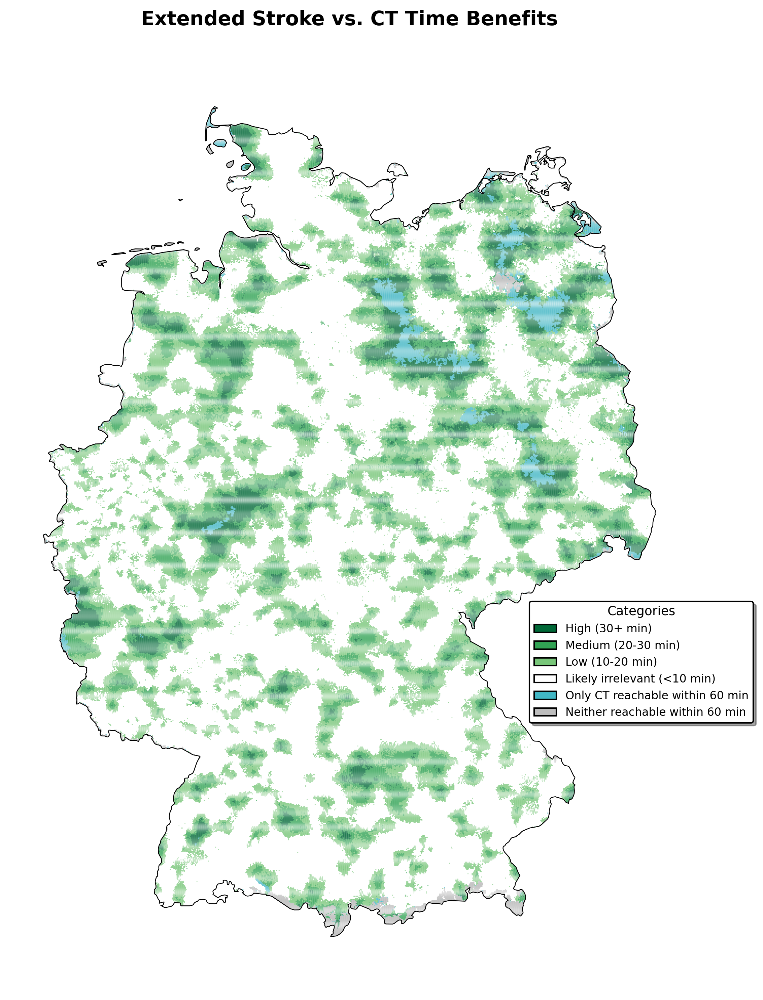

In [18]:
# Create benefit map for Extended Stroke vs CT (10-minute threshold)
if not benefit_gdf_extended_10min.empty:
    print("Creating Extended Stroke vs CT benefit visualization...")
    
    map_path = benefit.create_benefit_map(
        benefit_gdf_extended_10min,
        title="Extended Stroke vs. CT Time Benefits",
        ct_penalty=0.0,
        benefit_threshold=10.0
    )
    
    print(f"✅ Extended Stroke vs CT map saved: {map_path.name}")
    
    # Display in notebook
    from IPython.display import Image, display
    display(Image(filename=str(map_path), width=800))
else:
    print("⚠️  No Extended Stroke vs CT benefits to visualize")


Creating Extended Stroke vs CT penalty scenarios with polygon rendering...
   Calculating +10min Penalty...
🔍 Loading cached benefit analysis from benefit_analysis_937ec0540e64eb4b8ffa758ca7d93091.pkl
✅ Loaded 457,650 cached benefit points
     Found 457,650 benefit areas
   Calculating +20min Penalty...
🔍 Loading cached benefit analysis from benefit_analysis_38b3c524bae97b46b738698419ba74ef.pkl
✅ Loaded 461,098 cached benefit points
     Found 461,098 benefit areas
   Calculating +30min Penalty...
🔍 Loading cached benefit analysis from benefit_analysis_5c8c021f752692db2d261b1783732cac.pkl
✅ Loaded 542,783 cached benefit points
     Found 542,783 benefit areas
\nCreating three-penalty scenarios visualization with polygon rendering...


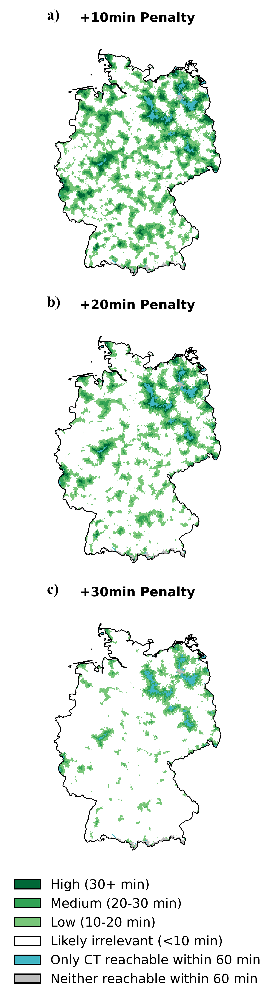

✅ Extended stroke penalty scenarios (polygon) saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Graphs/extended_stroke_three_penalty_scenarios_polygon.png


In [19]:
# UPDATED: Generate three-penalty scenarios for Extended Stroke vs CT using polygon rendering
print("Creating Extended Stroke vs CT penalty scenarios with polygon rendering...")

if extended_stroke_files_exist:
    # Define penalty scenarios for extended stroke analysis
    penalty_scenarios_extended = {
        "+10min Penalty": {"penalty": 10, "description": "Standard + 10min CT penalty"},
        "+20min Penalty": {"penalty": 20, "description": "Standard + 20min CT penalty"},
        "+30min Penalty": {"penalty": 30, "description": "Standard + 30min CT penalty"}
    }
    
    extended_penalty_results = {}
    
    for scenario_name, config in penalty_scenarios_extended.items():
        print(f"   Calculating {scenario_name}...")
        
        benefit_gdf = benefit.calculate_time_benefits_parallel(
            ct_suffix="_all_CTs",
            stroke_suffix="_extended_stroke",
            ct_penalty=config["penalty"],
            benefit_threshold=10.0,
            grid_resolution=0.010,
            time_bins=gs.config.TIME_BINS,
            max_workers=10,
            force_recalc=False
        )
        
        extended_penalty_results[scenario_name] = benefit_gdf
        print(f"     Found {len(benefit_gdf):,} benefit areas")
    
    # Create visualization using polygon rendering
    if extended_penalty_results:
        print("\\nCreating three-penalty scenarios visualization with polygon rendering...")
        
        # Load Germany outline
        germany = gs.data.load_germany_outline()
        
        # Create 3x1 subplot figure (vertical layout)
        fig, axes = plt.subplots(3, 1, figsize=(4.21, 11), dpi=500)
        
        # Use same colors and order as original function
        benefit_colors = {
            "High (30+ min)": "#006837",     # Dark green
            "Medium (20-30 min)": "#31a354", # Medium green  
            "Low (10-20 min)": "#78c679",    # Light green
            "Likely irrelevant (<10 min)": "white",  # White
            "Only CT reachable within 60 min": "#41b6c4",  # Teal
            "Neither reachable within 60 min": "#bdbdbd"  # Solid grey
        }
        
        # Plot each scenario
        panel_letters = ['a)', 'b)', 'c)']
        for i, (scenario_name, benefit_gdf) in enumerate(extended_penalty_results.items()):
            ax = axes[i]
            
            # Filter to Germany boundaries
            if not benefit_gdf.empty:
                if benefit_gdf.crs != germany.crs and germany.crs is not None:
                    benefit_gdf_filtered = benefit_gdf.to_crs(germany.crs)
                else:
                    benefit_gdf_filtered = benefit_gdf.copy()
                
                germany_geom = gpd.GeoDataFrame(geometry=germany.geometry, crs=germany.crs)
                benefit_gdf_filtered = gpd.sjoin(
                    benefit_gdf_filtered, 
                    germany_geom, 
                    how='inner', 
                    predicate='within'
                )
                
                if 'index_right' in benefit_gdf_filtered.columns:
                    benefit_gdf_filtered = benefit_gdf_filtered.drop(columns=['index_right'])
            else:
                benefit_gdf_filtered = benefit_gdf.copy()
            
            # Setup axis
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_facecolor("white")
            for spine in ax.spines.values():
                spine.set_visible(False)
            
            # Plot Germany outline
            germany.boundary.plot(ax=ax, color='black', linewidth=0.6, zorder=3)
            
            # Apply polygon aggregation for crisp visualization
            if not benefit_gdf_filtered.empty:
                grid = benefit.aggregate_points_to_grid(
                    benefit_gdf_filtered, germany,
                    category_col="benefit_category",
                    cell_size_deg=0.02,  # ~2km cells
                    grid_shape="square",
                    agg="mode"
                )
                benefit.plot_grid_categories(
                    grid_gdf=grid,
                    germany=germany,
                    ax=ax,
                    benefit_colors=benefit_colors,
                    show_healthcare_deserts=True
                )
            
            # Set bounds
            ax.set_xlim(germany.total_bounds[0] - 0.5, germany.total_bounds[2] + 0.5)
            ax.set_ylim(germany.total_bounds[1] - 0.5, germany.total_bounds[3] + 0.5)
            
            # Title and panel letter
            ax.set_title(scenario_name, fontsize=10, fontweight='bold', pad=10)
            ax.text(0.01, 1.1, panel_letters[i], transform=ax.transAxes,
                    fontweight="bold", fontsize=12, family="Times New Roman",
                    va="top", ha="left")
        
        # Add legend
        legend_elements = [
            mpatches.Patch(facecolor=benefit_colors[cat], label=cat, 
                           edgecolor='black', linewidth=1.0)
            for cat in benefit_colors.keys()
        ]
        
        fig.legend(handles=legend_elements, loc='lower center', 
                  bbox_to_anchor=(0.5, 0.02), ncol=1, fontsize=10, 
                  frameon=False)
        
        plt.tight_layout()
        plt.subplots_adjust(bottom=0.15)
        
        # Save and display
        penalty_output_path = gs.config.GRAPH_DIR / "extended_stroke_three_penalty_scenarios_polygon.png"
        plt.savefig(penalty_output_path, dpi=500, bbox_inches='tight')
        penalty_output_path_eps = gs.config.GRAPH_DIR / "extended_stroke_three_penalty_scenarios_polygon.eps"
        plt.savefig(penalty_output_path_eps, dpi=500, bbox_inches='tight')
        penalty_output_path_tiff = gs.config.GRAPH_DIR / "extended_stroke_three_penalty_scenarios_polygon.tiff"
        plt.savefig(penalty_output_path_tiff, dpi=500, bbox_inches='tight')
        plt.show()
        plt.close()
        
        print(f"✅ Extended stroke penalty scenarios (polygon) saved: {penalty_output_path}")
    
else:
    print("⚠️  Extended stroke isochrone data not available")


In [20]:
import geostroke as gs
import time

# Generate Missing Extended Stroke Isochrones for Emergency and Bad Traffic Scenarios
print("🔧 Generating Missing Extended Stroke Isochrones")
print("=" * 52)
print("Creating isochrones for:")
print("  • Emergency (+20% speed) - extended stroke units")  
print("  • Bad Traffic (-20% speed) - extended stroke units")
print()

# Load extended stroke units
try:
    df_extended_stroke = gs.data.load_extended_stroke_units()
    print(f"✅ Loaded {len(df_extended_stroke)} extended stroke units")
except Exception as e:
    print(f"❌ Error loading extended stroke units: {e}")
    df_extended_stroke = None

if df_extended_stroke is not None:
    # Check if ORS is available
    ors_available = True  # Assume available, will fail gracefully if not
    
    if ors_available:
        print("✅ Generating extended stroke scenarios...")
        
        # Define scenarios to generate (emergency and bad_traffic only)
        scenarios_to_generate = {
            'emergency': {
                'description': 'Emergency vehicle conditions (+20% speed)',
                'speed_factor': 1.2
            },
            'bad_traffic': {
                'description': 'Bad traffic conditions (-20% speed)', 
                'speed_factor': 0.8
            }
        }
        
        for scenario_name, scenario_config in scenarios_to_generate.items():
            print(f"\n📍 Generating {scenario_name.upper()} extended stroke scenario...")
            print(f"   Description: {scenario_config['description']}")
            
            try:
                start_time = time.time()
                
                # Generate isochrones using the iso_manager
                scenario_polygons = gs.iso_manager.ensure_polygons_parallel(
                    df_extended_stroke, 
                    force_recalc=False,  # Force generation since they're missing
                    scenario=scenario_name,
                    suffix=f"_extended_stroke",  # Extended stroke suffix
                    max_retries=3,
                    max_workers=6  # Use 6 workers to be safe
                )
                
                end_time = time.time()
                duration = end_time - start_time
                
                # Count valid polygons
                if scenario_polygons:
                    total_polygons = sum(len(polys) for polys in scenario_polygons.values())
                    valid_polygons = sum(
                        len([p for p in polys if p is not None and not p.is_empty]) 
                        for polys in scenario_polygons.values()
                    )
                    print(f"   ✅ {scenario_name} extended stroke complete! ({duration:.1f}s)")
                    print(f"   📊 Generated {valid_polygons}/{total_polygons} valid polygons")
                else:
                    print(f"   ❌ Failed to generate {scenario_name} extended stroke isochrones")
                    
            except Exception as e:
                print(f"   ❌ Error generating {scenario_name} extended stroke: {e}")
        
        print(f"\n🎉 Extended stroke scenario generation complete!")
        print(f"💾 All polygons cached for instant reuse in analysis")
        
    else:
        print("❌ Cannot generate extended stroke scenarios: OpenRouteService not available")
        print("   The benefit analysis will fail without these isochrones")

else:
    print("❌ Cannot proceed without extended stroke units data")

print("\n✅ Ready to run extended stroke scenario analysis!")

🔧 Generating Missing Extended Stroke Isochrones
Creating isochrones for:
  • Emergency (+20% speed) - extended stroke units
  • Bad Traffic (-20% speed) - extended stroke units

✅ Loaded 463 extended stroke units
✅ Generating extended stroke scenarios...

📍 Generating EMERGENCY extended stroke scenario...
   Description: Emergency vehicle conditions (+20% speed)
🔄 Processing scenario: Emergency vehicle conditions (+20% speed)
   Cache suffix: _extended_stroke_emergency
🚀 Using 6 parallel workers for isochrone generation
✅ Loaded cached polygons_extended_stroke_emergency: 463 facilities
   ✅ emergency extended stroke complete! (0.2s)
   📊 Generated 5556/5556 valid polygons

📍 Generating BAD_TRAFFIC extended stroke scenario...
   Description: Bad traffic conditions (-20% speed)
🔄 Processing scenario: Bad traffic conditions (0.8× speed)
   Cache suffix: _extended_stroke_bad_traffic
🚀 Using 6 parallel workers for isochrone generation


/Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/geostroke/data.py:79: RuntimeWarning: stroke_units_extended_geocoded.csv found in project root; consider moving it to /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/raw_data
  warnings.warn(


✅ Loaded cached polygons_extended_stroke_bad_traffic: 463 facilities
   ✅ bad_traffic extended stroke complete! (0.1s)
   📊 Generated 5556/5556 valid polygons

🎉 Extended stroke scenario generation complete!
💾 All polygons cached for instant reuse in analysis

✅ Ready to run extended stroke scenario analysis!


Creating Extended Stroke vs CT three-speed scenarios with polygon rendering...
   Calculating Normal...
🔍 Loading cached benefit analysis from benefit_analysis_a7de051274bc7b96bc21578eae3bb909.pkl
✅ Loaded 463,853 cached benefit points
     Found 463,853 benefit areas
   Calculating +20% Driving Speed...
🔍 Loading cached benefit analysis from benefit_analysis_4b54b7c3d0191fea56dcdd75abc538c7.pkl
✅ Loaded 443,468 cached benefit points
     Found 443,468 benefit areas
   Calculating -20% Driving Speed...
🔍 Loading cached benefit analysis from benefit_analysis_72562e2c5f97abd95cbf5dfd6c10e6f4.pkl
✅ Loaded 485,226 cached benefit points
     Found 485,226 benefit areas

Creating three-speed scenarios visualization with polygon rendering...


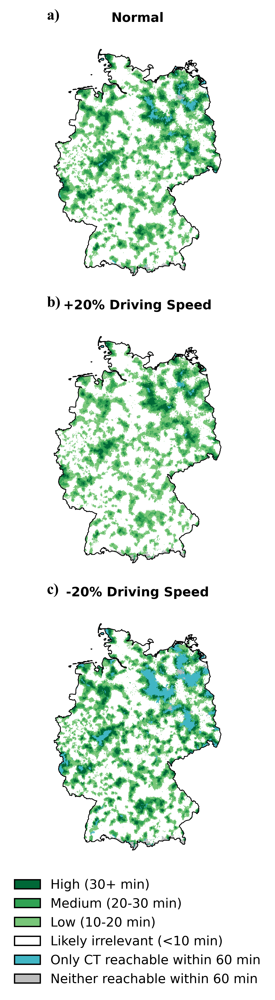

✅ Extended stroke speed scenarios (polygon) saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Graphs/extended_stroke_three_speed_scenarios_polygon.png


In [21]:
# UPDATED: Generate three-speed scenarios for Extended Stroke vs CT using polygon rendering
print("Creating Extended Stroke vs CT three-speed scenarios with polygon rendering...")

if extended_stroke_files_exist:
    # Define speed scenarios for extended stroke analysis
    scenarios_extended = {
        "Normal": {"suffix": "", "description": "Standard driving conditions"},
        "+20% Driving Speed": {"suffix": "_emergency", "description": "Emergency vehicle speed"},
        "-20% Driving Speed": {"suffix": "_bad_traffic", "description": "Bad traffic conditions"}
    }
    
    extended_scenario_results = {}
    
    for scenario_name, config in scenarios_extended.items():
        print(f"   Calculating {scenario_name}...")
        
        benefit_gdf = benefit.calculate_time_benefits_parallel(
            ct_suffix=f"_all_CTs{config['suffix']}",
            stroke_suffix=f"_extended_stroke{config['suffix']}",
            ct_penalty=0.0,
            benefit_threshold=10.0,
            grid_resolution=0.01,
            time_bins=gs.config.TIME_BINS,
            max_workers=10,
            force_recalc=False
        )
        
        extended_scenario_results[scenario_name] = benefit_gdf
        print(f"     Found {len(benefit_gdf):,} benefit areas")
    
    # Create visualization using polygon rendering
    if extended_scenario_results:
        print("\nCreating three-speed scenarios visualization with polygon rendering...")
        
        # Load Germany outline
        germany = gs.data.load_germany_outline()
        
        # Create 3x1 subplot figure (vertical layout)
        fig, axes = plt.subplots(3, 1, figsize=(4.21, 11), dpi=500)
        
        # Use same colors and order as original function
        benefit_colors = {
            "High (30+ min)": "#006837",     # Dark green
            "Medium (20-30 min)": "#31a354", # Medium green  
            "Low (10-20 min)": "#78c679",    # Light green
            "Likely irrelevant (<10 min)": "white",  # White
            "Only CT reachable within 60 min": "#41b6c4",  # Teal
            "Neither reachable within 60 min": "#bdbdbd"  # Solid grey
        }
        
        # Plot each scenario
        panel_letters = ['a)', 'b)', 'c)']
        for i, (scenario_name, benefit_gdf) in enumerate(extended_scenario_results.items()):
            ax = axes[i]
            
            # Filter to Germany boundaries
            if not benefit_gdf.empty:
                if benefit_gdf.crs != germany.crs and germany.crs is not None:
                    benefit_gdf_filtered = benefit_gdf.to_crs(germany.crs)
                else:
                    benefit_gdf_filtered = benefit_gdf.copy()
                
                germany_geom = gpd.GeoDataFrame(geometry=germany.geometry, crs=germany.crs)
                benefit_gdf_filtered = gpd.sjoin(
                    benefit_gdf_filtered, 
                    germany_geom, 
                    how='inner', 
                    predicate='within'
                )
                
                if 'index_right' in benefit_gdf_filtered.columns:
                    benefit_gdf_filtered = benefit_gdf_filtered.drop(columns=['index_right'])
            else:
                benefit_gdf_filtered = benefit_gdf.copy()
            
            # Setup axis
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_facecolor("white")
            for spine in ax.spines.values():
                spine.set_visible(False)
            
            # Plot Germany outline
            germany.boundary.plot(ax=ax, color='black', linewidth=0.6, zorder=3)
            
            # Apply polygon aggregation for crisp visualization
            if not benefit_gdf_filtered.empty:
                grid = benefit.aggregate_points_to_grid(
                    benefit_gdf_filtered, germany,
                    category_col="benefit_category",
                    cell_size_deg=0.02,  # ~2km cells
                    grid_shape="square",
                    agg="mode"
                )
                benefit.plot_grid_categories(
                    grid_gdf=grid,
                    germany=germany,
                    ax=ax,
                    benefit_colors=benefit_colors,
                    show_healthcare_deserts=True
                )
            
            # Set bounds
            ax.set_xlim(germany.total_bounds[0] - 0.5, germany.total_bounds[2] + 0.5)
            ax.set_ylim(germany.total_bounds[1] - 0.5, germany.total_bounds[3] + 0.5)
            
            # Title and panel letter
            ax.set_title(scenario_name, fontsize=10, fontweight='bold', pad=10)
            ax.text(0.01, 1.1, panel_letters[i], transform=ax.transAxes,
                    fontweight="bold", fontsize=12, family="Times New Roman",
                    va="top", ha="left")
        
        # Add legend
        legend_elements = [
            mpatches.Patch(facecolor=benefit_colors[cat], label=cat, 
                           edgecolor='black', linewidth=1.0)
            for cat in benefit_colors.keys()
        ]
        
        fig.legend(handles=legend_elements, loc='lower center', 
                  bbox_to_anchor=(0.5, 0.02), ncol=1, fontsize=10, 
                  frameon=False)
        
        plt.tight_layout()
        plt.subplots_adjust(bottom=0.15)
        
        # Save and display
        speed_output_path = gs.config.GRAPH_DIR / "extended_stroke_three_speed_scenarios_polygon.png"
        plt.savefig(speed_output_path, dpi=500, bbox_inches='tight')
        speed_output_path_eps = gs.config.GRAPH_DIR / "extended_stroke_three_speed_scenarios_polygon.eps"
        plt.savefig(speed_output_path_eps, dpi=500, bbox_inches='tight')
        speed_output_path_tiff = gs.config.GRAPH_DIR / "extended_stroke_three_speed_scenarios_polygon.tiff"
        plt.savefig(speed_output_path_tiff, dpi=500, bbox_inches='tight')
        plt.show()
        plt.close()
        
        print(f"✅ Extended stroke speed scenarios (polygon) saved: {speed_output_path}")
    
else:
    print("⚠️  Extended stroke isochrone data not available")


## Step 5: Extended Population Coverage Analysis

Now calculate population coverage for Extended Stroke vs CT scenarios using the same methodology as the regular stroke analysis.


In [22]:
# Extended Stroke Population Coverage Analysis  
# Analyze population coverage for extended stroke vs CT scenarios
print("Extended Stroke vs CT Population Coverage Analysis")
print("=" * 55)

if extended_stroke_files_exist:
    # Define scenarios for extended stroke analysis
    EXTENDED_SCENARIOS = {
        "Normal Speed (Extended)": {"suffix": "", "penalty": 0.0},
        "+20% Driving Speed": {"suffix": "_emergency", "penalty": 0.0},
        "-20% Driving Speed": {"suffix": "_bad_traffic", "penalty": 0.0},
        "+10min Penalty (Extended)": {"suffix": "", "penalty": 10},
        "+20min Penalty (Extended)": {"suffix": "", "penalty": 20},
        "+30min Penalty (Extended)": {"suffix": "", "penalty": 30},
    }
    
    extended_records = []
    
    for scenario_name, cfg in EXTENDED_SCENARIOS.items():
        print(f"\\n🔍 {scenario_name}")
        
        benefit_gdf = benefit.calculate_time_benefits_parallel(
            ct_suffix=f"_all_CTs{cfg['suffix']}",
            stroke_suffix=f"_extended_stroke{cfg['suffix']}",
            ct_penalty=cfg['penalty'],
            benefit_threshold=10.0,
            grid_resolution=0.01,
            time_bins=gs.config.TIME_BINS,
            max_workers=10,
            force_recalc=False,
        )
        
        if benefit_gdf.empty:
            print("   No benefit points -> everything Likely irrelevant")
            extended_records.append({
                "scenario": scenario_name,
                "category": "Likely irrelevant (<10 min)",
                "area_pct": 100.0,
                "population": POP_GERMANY,
                "population_pct": 100.0,
            })
            continue
        
        if benefit_gdf.crs != GERMANY.crs:
            benefit_gdf = benefit_gdf.to_crs(GERMANY.crs)
        benefit_gdf = gpd.sjoin(benefit_gdf, GERMANY[["geometry"]], how="inner", predicate="within")
        if 'index_right' in benefit_gdf.columns:
            benefit_gdf = benefit_gdf.drop(columns=['index_right'])
        
        # AREA from point counts (fast, unchanged)
        grid_df = gpd.GeoDataFrame(geometry=GERMANY_GRID)
        grid_join = gpd.sjoin(grid_df, benefit_gdf[["benefit_category", "geometry"]], how="left", predicate="within")
        grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)
        area_counts = grid_join["benefit_category"].value_counts()
        
        # POP from buffered cells (reuse existing function)
        cat_geoms = build_cat_geoms_from_grid(grid_join)
        
        def rasterize_and_sum_extended(cat_geoms_ext):
            cat_codes = {cat: i+1 for i, cat in enumerate(CATEGORY_ORDER)}
            shapes = []
            for cat, geom in cat_geoms_ext.items():
                if geom is None or geom.is_empty:
                    continue
                # flatten multiparts
                geoms_iter = list(geom.geoms) if hasattr(geom, "geoms") else [geom]
                for g in geoms_iter:
                    gdf = gpd.GeoDataFrame(geometry=[g], crs=GERMANY.crs)
                    if gdf.crs != POP_RASTER_CRS:
                        gdf = gdf.to_crs(POP_RASTER_CRS)
                    shapes.append((gdf.geometry.iloc[0], cat_codes[cat]))
            
            cat_raster = rasterize(
                shapes=shapes,
                out_shape=pop_arr_full.shape,
                transform=pop_transform,
                fill=0,
                dtype="uint8"
            )
            return {cat: int(pop_arr_full[cat_raster == code].sum()) for cat, code in cat_codes.items()}
        
        pop_counts = rasterize_and_sum_extended(cat_geoms)
        
        # Check population balance
        diff = POP_GERMANY - sum(pop_counts.values())
        if diff != 0:
            print(f"   ⚠ pop mismatch: {diff}")
            pop_counts["Likely irrelevant (<10 min)"] += diff
        
        for cat in CATEGORY_ORDER:
            area_pts = int(area_counts.get(cat, 0))
            area_pct = round(area_pts / GRID_COUNT * 100, 1)
            pop_abs = pop_counts.get(cat, 0)
            pop_pct = round(pop_abs / POP_GERMANY * 100, 1)
            extended_records.append({
                "scenario": scenario_name,
                "category": cat,
                "area_pct": area_pct,
                "population": pop_abs,
                "population_pct": pop_pct,
            })
    
    # Create results dataframe for extended analysis
    extended_results_df = pd.DataFrame(extended_records)
    
    extended_area_table = (extended_results_df.pivot_table(index="scenario", columns="category", values="area_pct", fill_value=0)
                          .loc[:, CATEGORY_ORDER].round(1))
    
    extended_pop_abs_table = (extended_results_df.pivot_table(index="scenario", columns="category", values="population", fill_value=0)
                             .loc[:, CATEGORY_ORDER])
    
    extended_pop_pct_table = (extended_results_df.pivot_table(index="scenario", columns="category", values="population_pct", fill_value=0)
                             .loc[:, CATEGORY_ORDER].round(1))
    
    print("\\n📊 Extended Stroke vs CT - Area %:")
    print(extended_area_table)
    print("\\n👥 Extended Stroke vs CT - Population Absolute:")
    print(extended_pop_abs_table.map(lambda x: f"{x:,}"))
    print("\\n👥 Extended Stroke vs CT - Population %:")
    print(extended_pop_pct_table)
    
    print("\\n✅ Extended stroke coverage verification:")
    for s in extended_area_table.index:
        print(f"  {s}: area {extended_area_table.loc[s].sum():.1f}% - pop {extended_pop_pct_table.loc[s].sum():.1f}%")

else:
    print("⚠️  Skipping extended stroke population analysis - data not available")
    extended_results_df = pd.DataFrame()

print("\\n✅ Extended stroke population coverage analysis complete.")


Extended Stroke vs CT Population Coverage Analysis
\n🔍 Normal Speed (Extended)
🔍 Loading cached benefit analysis from benefit_analysis_a7de051274bc7b96bc21578eae3bb909.pkl
✅ Loaded 463,853 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/3120758376.py:53: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


   ⚠ pop mismatch: 1
\n🔍 +20% Driving Speed
🔍 Loading cached benefit analysis from benefit_analysis_4b54b7c3d0191fea56dcdd75abc538c7.pkl
✅ Loaded 443,468 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/3120758376.py:53: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


   ⚠ pop mismatch: 3
\n🔍 -20% Driving Speed
🔍 Loading cached benefit analysis from benefit_analysis_72562e2c5f97abd95cbf5dfd6c10e6f4.pkl
✅ Loaded 485,226 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/3120758376.py:53: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


   ⚠ pop mismatch: 3
\n🔍 +10min Penalty (Extended)
🔍 Loading cached benefit analysis from benefit_analysis_937ec0540e64eb4b8ffa758ca7d93091.pkl
✅ Loaded 457,650 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/3120758376.py:53: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


   ⚠ pop mismatch: 2
\n🔍 +20min Penalty (Extended)
🔍 Loading cached benefit analysis from benefit_analysis_38b3c524bae97b46b738698419ba74ef.pkl
✅ Loaded 461,098 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/3120758376.py:53: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


   ⚠ pop mismatch: 2
\n🔍 +30min Penalty (Extended)
🔍 Loading cached benefit analysis from benefit_analysis_5c8c021f752692db2d261b1783732cac.pkl
✅ Loaded 542,783 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/3120758376.py:53: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  grid_join["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


   ⚠ pop mismatch: 2
\n📊 Extended Stroke vs CT - Area %:
category                   High (30+ min)  Medium (20-30 min)  \
scenario                                                        
+10min Penalty (Extended)             4.5                11.4   
+20% Driving Speed                    3.2                10.2   
+20min Penalty (Extended)             2.1                 7.1   
+30min Penalty (Extended)             0.0                 3.3   
-20% Driving Speed                    7.1                13.3   
Normal Speed (Extended)               5.3                12.6   

category                   Low (10-20 min)  Only CT reachable within 60 min  \
scenario                                                                      
+10min Penalty (Extended)             23.6                              1.9   
+20% Driving Speed                    25.4                              0.5   
+20min Penalty (Extended)             17.5                              1.9   
+30min Penalty (Extended)  

# Step 6: Dual State and County Analysis

Create side-by-side comparisons for states and counties showing both Regular Stroke vs CT and Extended Stroke vs CT analyses. This provides a comprehensive view of how stroke care accessibility differs when including more hospitals with frequent stroke procedures.


In [23]:
# ================== DUAL ANALYSIS: Regular vs Extended Stroke vs CTs ==================
# Modified state & county analysis to show both regular and extended stroke comparisons
# =====================================================================================

import os, json, warnings, math
from pathlib import Path
from typing import Dict, List, Optional, Tuple
warnings.filterwarnings("ignore", category=UserWarning)

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.backends.backend_pdf import PdfPages

# Configuration for dual analysis
RENDER_MODE = "polygons"   # "points" | "polygons" | "raster"
GRID_SHAPE = "square"     # for polygon render: "square" | "hex"
CELL_SIZE_DEG = 0.01      # ~1km for polygon mode
DISSOLVE_POLYS = True     # dissolve by category for smoother fill
PDF_STATES = True
PDF_COUNTIES = True

# Update result directories for dual analysis
DUAL_STATE_DIR = gs.config.RESULTS_DIR / "States_Dual"
DUAL_COUNTY_DIR = gs.config.RESULTS_DIR / "Counties_Dual" 
DUAL_COUNTY_DETAILED = gs.config.RESULTS_DIR / "Counties_detailed_Dual"

DUAL_STATE_DIR.mkdir(parents=True, exist_ok=True)
DUAL_COUNTY_DIR.mkdir(parents=True, exist_ok=True)
DUAL_COUNTY_DETAILED.mkdir(parents=True, exist_ok=True)
# right after you (re)define GRID_RESOLUTION in ANY script:
HALF = GRID_RESOLUTION / 2.0

def square_cell(pt: Point, half: float = None) -> Polygon:
    if half is None:
        half = GRID_RESOLUTION / 2.0  # always derive from current value
    x, y = pt.x, pt.y
    return Polygon([(x-half, y-half), (x+half, y-half),
                    (x+half, y+half), (x-half, y+half)])

print("🔄 Setting up dual analysis (Regular + Extended Stroke vs CTs)...")
print("=" * 65)

# Check data availability for both analyses
print("Data availability check:")
regular_available = ct_files_exist and stroke_files_exist  
extended_available = ct_files_exist and extended_stroke_files_exist

print(f"✓ Regular Stroke vs CT: {'Available' if regular_available else 'Missing'}")
print(f"✓ Extended Stroke vs CT: {'Available' if extended_available else 'Missing'}")

if not regular_available and not extended_available:
    print("⚠️  No data available for dual analysis")
elif not extended_available:
    print("⚠️  Only regular stroke analysis will be shown")  
elif not regular_available:
    print("⚠️  Only extended stroke analysis will be shown")
else:
    print("✅ Full dual analysis possible")

print(f"\\nOutput directories:")
print(f"  States: {DUAL_STATE_DIR}")
print(f"  Counties: {DUAL_COUNTY_DIR}")
print(f"  Counties Detailed: {DUAL_COUNTY_DETAILED}")


🔄 Setting up dual analysis (Regular + Extended Stroke vs CTs)...
Data availability check:
✓ Regular Stroke vs CT: Available
✓ Extended Stroke vs CT: Available
✅ Full dual analysis possible
\nOutput directories:
  States: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/States_Dual
  Counties: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/Counties_Dual
  Counties Detailed: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/Counties_detailed_Dual


In [24]:
# Calculate benefit data for both analyses (Normal Speed scenario)
print("\n🔄 Calculating benefit data for dual comparison...")

# Regular Stroke vs CT  
if regular_available:
    print("   Calculating Regular Stroke vs CT...")
    benefit_gdf_regular = benefit.calculate_time_benefits_parallel(
        ct_suffix=f"_all_CTs{SCENARIO_CFG['suffix']}",
        stroke_suffix=SCENARIO_CFG['suffix'],
        ct_penalty=SCENARIO_CFG['penalty'],
        benefit_threshold=10.0,
        grid_resolution=GRID_RESOLUTION,
        time_bins=TIME_BINS,
        max_workers=10,
        force_recalc=False,
    )
    if benefit_gdf_regular.crs != GERMANY.crs:
        benefit_gdf_regular = benefit_gdf_regular.to_crs(GERMANY.crs)
    benefit_gdf_regular = gpd.sjoin(benefit_gdf_regular, GERMANY[["geometry"]], how="inner", predicate="within")
    benefit_gdf_regular.drop(columns=["index_right"], inplace=True, errors="ignore")
    
    grid_with_cat_regular = classify_grid_points(benefit_gdf_regular)
    cat_geoms_regular = build_cat_geoms_from_grid(grid_with_cat_regular)
    print(f"      ✓ Regular: {len(benefit_gdf_regular):,} benefit areas")
else:
    benefit_gdf_regular = gpd.GeoDataFrame()
    grid_with_cat_regular = gpd.GeoDataFrame()
    cat_geoms_regular = {}

# Extended Stroke vs CT
if extended_available:
    print("   Calculating Extended Stroke vs CT...")
    benefit_gdf_extended = benefit.calculate_time_benefits_parallel(
        ct_suffix="_all_CTs",
        stroke_suffix="_extended_stroke",  # Extended stroke units
        ct_penalty=0.0,
        benefit_threshold=10.0,
        grid_resolution=GRID_RESOLUTION,
        time_bins=TIME_BINS,
        max_workers=10,
        force_recalc=False,
    )
    if benefit_gdf_extended.crs != GERMANY.crs:
        benefit_gdf_extended = benefit_gdf_extended.to_crs(GERMANY.crs)
    benefit_gdf_extended = gpd.sjoin(benefit_gdf_extended, GERMANY[["geometry"]], how="inner", predicate="within")
    benefit_gdf_extended.drop(columns=["index_right"], inplace=True, errors="ignore")
    
    grid_with_cat_extended = classify_grid_points(benefit_gdf_extended)
    cat_geoms_extended = build_cat_geoms_from_grid(grid_with_cat_extended)
    print(f"      ✓ Extended: {len(benefit_gdf_extended):,} benefit areas")
else:
    benefit_gdf_extended = gpd.GeoDataFrame()
    grid_with_cat_extended = gpd.GeoDataFrame()
    cat_geoms_extended = {}

print("✅ Benefit data calculation complete")

# Helper function for dual region plotting
def dual_region_plot(fig, region_geom, region_name, render_mode=RENDER_MODE):
    """Create side-by-side plots for regular and extended stroke analyses"""
    
    # CHANGED: small helper to always get a flat list of Axes
    def _flat_axes(axs):
        if isinstance(axs, (list, tuple)):
            return list(axs)
        try:
            return axs.ravel().tolist()
        except AttributeError:
            return [axs]

    # Determine subplot layout based on available data
    if regular_available and extended_available:
        axes = fig.subplots(1, 2)
        axes = _flat_axes(axes)  # CHANGED
        titles = ["Regular Stroke vs CT", "Extended Stroke vs CT"]
        datasets = [
            (benefit_gdf_regular, grid_with_cat_regular, cat_geoms_regular),
            (benefit_gdf_extended, grid_with_cat_extended, cat_geoms_extended)
        ]
    elif regular_available:
        axes = _flat_axes(fig.subplots(1, 1))  # CHANGED
        titles = ["Regular Stroke vs CT"]
        datasets = [(benefit_gdf_regular, grid_with_cat_regular, cat_geoms_regular)]
    elif extended_available:
        axes = _flat_axes(fig.subplots(1, 1))  # CHANGED
        titles = ["Extended Stroke vs CT"]
        datasets = [(benefit_gdf_extended, grid_with_cat_extended, cat_geoms_extended)]
    else:
        return  # No data available
    
    for ax, title, (benefit_gdf, grid_with_cat, cat_geoms) in zip(axes, titles, datasets):
        ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values(): sp.set_visible(False)
        
        # Draw region boundary
        gpd.GeoDataFrame(geometry=[region_geom], crs=GERMANY.crs).boundary.plot(
            ax=ax, color="black", linewidth=0.6, zorder=3)
        
        # Plot benefit data
        if not benefit_gdf.empty:
            region_plot(ax, region_geom, benefit_gdf, grid_with_cat, render_mode,
                        BENEFIT_COLORS, GERMANY, markersize=0.3,
                        grid_shape=GRID_SHAPE, cell_size_deg=CELL_SIZE_DEG,
                        dissolve=DISSOLVE_POLYS)
        
        ax.set_title(f"{title}\n{region_name}", fontsize=10, fontweight="bold")
    
    # Add shared legend
    handles = make_benefit_handles(BENEFIT_COLORS)
    fig.legend(handles=handles, loc="lower center", ncol=3, frameon=False, fontsize=8)
    
    return axes

print("\n📊 Dual plotting function ready")


🔄 Calculating benefit data for dual comparison...
   Calculating Regular Stroke vs CT...
🔍 Loading cached benefit analysis from benefit_analysis_e1f09274ca3df68bc9344be034cc005f.pkl
✅ Loaded 510,229 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/2068438091.py:177: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  joined["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


      ✓ Regular: 253,795 benefit areas
   Calculating Extended Stroke vs CT...
🔍 Loading cached benefit analysis from benefit_analysis_a7de051274bc7b96bc21578eae3bb909.pkl
✅ Loaded 463,853 cached benefit points


/var/folders/l_/hnp4n5y13k3dbz2xfjjz44p00000gn/T/ipykernel_1970/2068438091.py:177: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  joined["benefit_category"].fillna("Likely irrelevant (<10 min)", inplace=True)


      ✓ Extended: 207,682 benefit areas
✅ Benefit data calculation complete

📊 Dual plotting function ready


In [25]:
# DUAL STATES ANALYSIS - Create side-by-side comparisons for states
print("\n🏛️ Creating dual states analysis...")

if regular_available or extended_available:
    # Create dual statistics for states  
    dual_state_rows = []
    
    for _, st in states.iterrows():
        st_name = st.get('NAME_1', 'Unknown')
        
        # Regular stroke stats
        if regular_available:
            df_stats_regular = stats_for_region(st.geometry, f"{st_name} (Regular)", 
                                               grid_with_cat_regular, cat_geoms_regular)
            df_stats_regular['analysis_type'] = 'Regular Stroke vs CT'
            dual_state_rows.append(df_stats_regular)
        
        # Extended stroke stats
        if extended_available:
            df_stats_extended = stats_for_region(st.geometry, f"{st_name} (Extended)", 
                                                grid_with_cat_extended, cat_geoms_extended)
            df_stats_extended['analysis_type'] = 'Extended Stroke vs CT'
            dual_state_rows.append(df_stats_extended)
        
        # Create dual visualization for this state
        if regular_available or extended_available:
            figsize = (16, 6) if (regular_available and extended_available) else (8, 6)
            fig = plt.figure(figsize=figsize, dpi=300)
            
            dual_region_plot(fig, st.geometry, st_name, render_mode=RENDER_MODE)
            
            # Adjust layout and save
            plt.tight_layout()
            fig.subplots_adjust(bottom=0.15)  # Space for legend
            
            png_path = DUAL_STATE_DIR / f"Dual_Benefit_{st_name.replace(' ','_')}.png"
            fig.savefig(png_path, dpi=300, bbox_inches="tight")
            plt.close(fig)
            
            print(f"   ✓ {st_name} dual analysis saved")
    
    # Combine all state statistics
    if dual_state_rows:
        dual_state_df = pd.concat(dual_state_rows, ignore_index=True)
        
        # Save comprehensive Excel file with both analyses
        dual_xlsx = DUAL_STATE_DIR / "dual_benefit_state_stats.xlsx"
        with pd.ExcelWriter(dual_xlsx, engine='openpyxl') as w:
            # Long format with both analyses
            dual_state_df.to_excel(w, sheet_name="long_format", index=False)
            
            # Separate sheets for each analysis type
            if regular_available:
                regular_data = dual_state_df[dual_state_df['analysis_type'] == 'Regular Stroke vs CT']
                regular_pivot = (regular_data.pivot_table(index="region", columns="category", 
                                                        values="population_pct", fill_value=0)
                               .reindex(columns=CATEGORY_ORDER))
                regular_pivot.to_excel(w, sheet_name="regular_pop_pct")
            
            if extended_available:
                extended_data = dual_state_df[dual_state_df['analysis_type'] == 'Extended Stroke vs CT']
                extended_pivot = (extended_data.pivot_table(index="region", columns="category", 
                                                          values="population_pct", fill_value=0)
                                .reindex(columns=CATEGORY_ORDER))
                extended_pivot.to_excel(w, sheet_name="extended_pop_pct")
        
        print(f"   ✓ Dual states Excel saved: {dual_xlsx.name}")
        print(f"   📊 Total states analyzed: {len(states)}")
        
        # Display sample comparison
        if len(dual_state_df) > 0:
            print(f"\n📋 Sample state comparison (first state):")
            sample_state = dual_state_df['region'].str.replace(' (Regular)', '').str.replace(' (Extended)', '').iloc[0]
            sample_data = dual_state_df[dual_state_df['region'].str.contains(sample_state)]
            if len(sample_data) > 0:
                print(sample_data[['region', 'analysis_type', 'category', 'population_pct']].head(12))

else:
    print("⚠️  No data available for dual states analysis")

print("\n✅ Dual states analysis complete")



🏛️ Creating dual states analysis...
   ✓ Baden-Württemberg dual analysis saved
   ✓ Bayern dual analysis saved
   ✓ Berlin dual analysis saved
   ✓ Brandenburg dual analysis saved
   ✓ Bremen dual analysis saved
   ✓ Hamburg dual analysis saved
   ✓ Hessen dual analysis saved
   ✓ Mecklenburg-Vorpommern dual analysis saved
   ✓ Niedersachsen dual analysis saved
   ✓ Nordrhein-Westfalen dual analysis saved
   ✓ Rheinland-Pfalz dual analysis saved
   ✓ Saarland dual analysis saved
   ✓ Sachsen-Anhalt dual analysis saved
   ✓ Sachsen dual analysis saved
   ✓ Schleswig-Holstein dual analysis saved
   ✓ Thüringen dual analysis saved
   ✓ Dual states Excel saved: dual_benefit_state_stats.xlsx
   📊 Total states analyzed: 16

📋 Sample state comparison (first state):
                          region          analysis_type  \
0    Baden-Württemberg (Regular)   Regular Stroke vs CT   
1    Baden-Württemberg (Regular)   Regular Stroke vs CT   
2    Baden-Württemberg (Regular)   Regular Stroke vs 

In [32]:
from pathlib import Path
from geostroke import dual_side_by_side as dsp


ctx = dsp.Context(
    GERMANY=GERMANY,
    GERMANY_GRID=GERMANY_GRID,
    states=states,
    counties=counties,
    pop_arr_full=pop_arr_full,
    pop_transform=pop_transform,
    POP_RASTER_CRS=POP_RASTER_CRS,
    TIME_BINS=TIME_BINS,
    GRID_RESOLUTION=GRID_RESOLUTION,
)

run_cfg = dsp.RunConfig(
    OUT_ROOT=Path(gs.config.RESULTS_DIR) / "Dual_All_Scenarios",
    CPU_STATES=12,
    CPU_COUNTIES=12,
    RUN_COUNTIES=True,
    PDF_STATES=True,
    PDF_COUNTIES=True,
    RENDER_MODE="polygons",
)

dsp.run_all_scenarios(ctx, scenarios=dsp.DEFAULT_SCENARIOS,
                      run_cfg=run_cfg, benefit_module=benefit, gs_module=gs)

=== Normal Speed ===
🔍 Loading cached benefit analysis from benefit_analysis_68daa23e802db74fe3c8131cf475fc86.pkl
✅ Loaded 510,229 cached benefit points
🔍 Loading cached benefit analysis from benefit_analysis_a7de051274bc7b96bc21578eae3bb909.pkl
✅ Loaded 463,853 cached benefit points
   -> State PDF saved: Dual_Benefit_states_Normal_Speed.pdf
   50/400 counties …
   100/400 counties …
   150/400 counties …
   200/400 counties …
   250/400 counties …
   300/400 counties …
   350/400 counties …
   400/400 counties …
   -> County PDF saved: Dual_Benefit_counties_Normal_Speed.pdf
=== +20% Speed (Emergency) ===
🚀 Calculating CT vs Stroke benefits with 10 processes
   Threshold: 10.0 min, CT penalty: 0.0 min
📦 Loading isochrone data...
   📊 poly5_all_CTs_emergency.pkl: 1475/1475 valid polygons
   📊 poly10_all_CTs_emergency.pkl: 1475/1475 valid polygons
   📊 poly15_all_CTs_emergency.pkl: 1475/1475 valid polygons
   📊 poly20_all_CTs_emergency.pkl: 1475/1475 valid polygons
   📊 poly25_all_CTs_e

### Create Supplementary PDFs

In [35]:


from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages


# Optional: if you want to reuse the category order from the run config, hardcode here
CATEGORY_ORDER = (
    "High (30+ min)",
    "Medium (20-30 min)",
    "Low (10-20 min)",
    "Only CT reachable within 60 min",
    "Neither reachable within 60 min",
    "Likely irrelevant (<10 min)",
)

# --------------------------- Configurable paths ---------------------------------
OUT_ROOT = Path(gs.config.RESULTS_DIR) / "Dual_All_Scenarios"
STATE_XLSX = OUT_ROOT / "dual_benefit_state_stats_ALL.xlsx"
COUNTY_XLSX = OUT_ROOT / "dual_benefit_county_stats_ALL.xlsx"


# PDF names
STATE_PDF = OUT_ROOT / "Supplement_State_Tables_Regular_vs_Extended.pdf"
COUNTY_PDF = OUT_ROOT / "Supplement_County_Tables_Regular_vs_Extended.pdf"

# --------------------------- Helper functions -----------------------------------

def _sort_categories(df: pd.DataFrame, col="category") -> pd.DataFrame:
    if col in df.columns:
        df[col] = pd.Categorical(df[col], CATEGORY_ORDER, ordered=True)
        return df.sort_values(col)
    return df


def _render_table_page(pdf, df, title, figsize=(11.69, 8.27), font_size=8, scale=(1, 1.5)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.axis("off")
    tbl = ax.table(cellText=df.values, colLabels=df.columns, cellLoc="center", loc="center")
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(font_size)
    tbl.scale(*scale)
    ax.text(0.5, 1.25, title, transform=ax.transAxes, ha="center", va="bottom",
            fontweight="bold", fontsize=14)
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)


def _per_region_excels(df_region, out_dir: Path, prefix: str, region_name: str):
    x_path = out_dir / f"{prefix}_{region_name.replace(' ', '_')}.xlsx"
    df_region.to_excel(x_path, index=False)


def _prep_long_df(df_long: pd.DataFrame) -> pd.DataFrame:
    # Expected columns: region, category, area_pts, area_pct, population, population_pct,
    # scenario, analysis_type (+ maybe state for counties)
    keep = [c for c in ["category", "area_pts", "area_pct", "population", "population_pct"] if c in df_long.columns]
    renamed = {
        "category": "Category",
        "area_pts": "Grid Cells",
        "area_pct": "Area (%)",
        "population": "Population",
        "population_pct": "Population (%)",
    }
    df_print = df_long[keep].rename(columns=renamed)
    return _sort_categories(df_print, col="Category")

# --------------------------- Main routine ---------------------------------------
try:
    # Load data
    state_df_all = pd.read_excel(STATE_XLSX, sheet_name="long") if STATE_XLSX.exists() else None
    county_df_all = pd.read_excel(COUNTY_XLSX, sheet_name="long") if COUNTY_XLSX.exists() else None

    if state_df_all is None and county_df_all is None:
        raise FileNotFoundError("No combined stats Excel files found. Run dsp.run_all_scenarios first.")

    # =================== STATES PDF ====================
    if state_df_all is not None:
        with PdfPages(STATE_PDF) as pdf:
            for (scen, atype), df_grp in state_df_all.groupby(["scenario", "analysis_type"], dropna=False):
                for st_name in df_grp["region"].unique():
                    df_st = df_grp[df_grp["region"] == st_name].copy()
                    if df_st.empty:
                        continue
                    df_print = _prep_long_df(df_st)
                    _per_region_excels(df_print, OUT_ROOT, f"pop_results_{scen.replace(' ', '_')}_{atype.lower()}_{st_name.replace(' ', '_')}", st_name)
                    title = f"Population and Area Coverage in {st_name} — {atype} ({scen})"
                    _render_table_page(pdf, df_print, title)
        print(f"✅ State supplementary PDF saved: {STATE_PDF}")

    # =================== COUNTIES PDF ====================
    if county_df_all is not None:
        with PdfPages(COUNTY_PDF) as pdf:
            for (scen, atype), df_grp in county_df_all.groupby(["scenario", "analysis_type"], dropna=False):
                for (state_name, county_region) in df_grp[["state", "region"]].drop_duplicates().itertuples(index=False):
                    df_ct = df_grp[(df_grp["state"] == state_name) & (df_grp["region"] == county_region)].copy()
                    if df_ct.empty:
                        continue
                    df_print = _prep_long_df(df_ct)
                    prefix = f"pop_results_{scen.replace(' ', '_')}_{atype.lower()}_{state_name.replace(' ', '_')}_{county_region.replace(' ', '_')}"
                    _per_region_excels(df_print, OUT_ROOT, prefix, county_region)
                    title = f"Population and Area Coverage in {county_region} ({state_name}) — {atype} ({scen})"
                    _render_table_page(pdf, df_print, title)
        print(f"✅ County supplementary PDF saved: {COUNTY_PDF}")

except Exception as e:
    print(f"✗ Error while generating supplementary PDFs: {e}")
    import traceback
    traceback.print_exc()

✅ State supplementary PDF saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/Dual_All_Scenarios/Supplement_State_Tables_Regular_vs_Extended.pdf
✅ County supplementary PDF saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/Dual_All_Scenarios/Supplement_County_Tables_Regular_vs_Extended.pdf


In [34]:
# --------------------------- JSON exports ---------------------------------------
import json

# Output paths
STATE_JSON = OUT_ROOT / "dual_benefit_state_stats_ALL.json"
COUNTY_JSON = OUT_ROOT / "dual_benefit_county_stats_ALL.json"

def _build_nested(df: pd.DataFrame, key_order):
    """
    Turn a long df into a nested dict keyed by the columns in key_order.
    The leaf level is a list of row dicts (pretty-printed version via _prep_long_df).
    """
    out = {}
    for keys, sub in df.groupby(key_order, dropna=False):
        d = out
        # walk/create the nested dict levels
        for k in keys[:-1]:
            d = d.setdefault(str(k), {})
        # last level: store the table rows
        d[str(keys[-1])] = _prep_long_df(sub).to_dict(orient="records")
    return out

try:
    if state_df_all is not None:
        # state -> scenario -> analysis_type -> rows
        state_nested = _build_nested(state_df_all, ["region", "scenario", "analysis_type"])
        STATE_JSON.write_text(json.dumps(state_nested, indent=2, ensure_ascii=False))
        print(f"✅ State JSON saved: {STATE_JSON}")

    if county_df_all is not None:
        # state -> county -> scenario -> analysis_type -> rows
        county_nested = {}
        for (st, cnty), df_grp in county_df_all.groupby(["state", "region"], dropna=False):
            county_nested.setdefault(st, {})
            county_nested[st][cnty] = _build_nested(df_grp, ["scenario", "analysis_type"])
        COUNTY_JSON.write_text(json.dumps(county_nested, indent=2, ensure_ascii=False))
        print(f"✅ County JSON saved: {COUNTY_JSON}")

except Exception as e:
    print(f"✗ Error while generating JSONs: {e}")
    import traceback
    traceback.print_exc()

✅ State JSON saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/Dual_All_Scenarios/dual_benefit_state_stats_ALL.json
✅ County JSON saved: /Users/larsmasanneck/Library/CloudStorage/OneDrive-Personal/Dokumente/Research Basics and Coding Projects/Data Projects/Marc Pawlitzki/GeoStroke/Results/Dual_All_Scenarios/dual_benefit_county_stats_ALL.json
